# 🧠 Alzheimer's MRI Classification System
### Complete Pipeline: Preprocessing → 7 Models → Grad-CAM → Research Graphs
---

## PHASE 1 — Environment Setup

In [1]:
# ============================================================
# 1. Install Required Libraries
# ============================================================
!pip install -q timm
!pip install -q grad-cam==1.4.6
!pip install -q torchmetrics
!pip install -q seaborn
!pip install -q scikit-learn

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 35.3 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 983.4/983.4 kB 23.6 MB/s eta 0:00:00


In [2]:
# ============================================================
# 2. Import Core Libraries
# ============================================================
import os
import random
import warnings
import time
from glob import glob

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
from PIL import Image

import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.models as models
from torchvision import transforms as T
from torchvision import datasets
from torch.utils.data import Dataset, DataLoader, random_split

from sklearn.metrics import (
    confusion_matrix,
    classification_report,
    roc_curve,
    auc,
    roc_auc_score
)

import timm
from tqdm import tqdm
import torchmetrics

from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget

warnings.filterwarnings("ignore")

In [3]:
# ============================================================
# 3. Reproducibility Seeds
# ============================================================
SEED = 2025
import random, numpy as np, torch
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed(SEED)
torch.cuda.manual_seed_all(SEED)

# NOTE: deterministic=True kills GPU speed by 3-5x on conv layers.
# benchmark=True lets cuDNN find the fastest kernel for your input size.
torch.backends.cudnn.deterministic = False
torch.backends.cudnn.benchmark     = True


In [4]:
# ============================================================
# 4. GPU / Device Configuration
# ============================================================
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

print("=" * 60)
print("DEVICE CONFIGURATION")
print("=" * 60)
print(f"Device Type       : {device}")
if torch.cuda.is_available():
    print(f"GPU Name          : {torch.cuda.get_device_name(0)}")
    print(f"CUDA Version      : {torch.version.cuda}")
    print(f"GPU Memory (GB)   : {round(torch.cuda.get_device_properties(0).total_memory / 1024**3, 2)}")
else:
    print("Running on CPU")

DEVICE CONFIGURATION
Device Type       : cuda
GPU Name          : Tesla T4
CUDA Version      : 12.8
GPU Memory (GB)   : 14.56


In [5]:
# ============================================================
# 5. Global Configuration
# ============================================================
IMG_SIZE    = 176
BATCH_SIZE  = 32
NUM_CLASSES = 4
EPOCHS      = 20

CLASSES = [
    "Mild Impairment",
    "Moderate Impairment",
    "No Impairment",
    "Very Mild Impairment"
]

MEAN = [0.485, 0.456, 0.406]
STD  = [0.229, 0.224, 0.225]

print("=" * 60)
print(" PROJECT CONFIGURATION")
print("=" * 60)
print(f"Image Size        : {IMG_SIZE} x {IMG_SIZE}")
print(f"Batch Size        : {BATCH_SIZE}")
print(f"Classes           : {NUM_CLASSES}")
print(f"Class Names       : {CLASSES}")
print(f"Epochs            : {EPOCHS}")
print(f"Mean              : {MEAN}")
print(f"Std               : {STD}")

 PROJECT CONFIGURATION
Image Size        : 176 x 176
Batch Size        : 32
Classes           : 4
Class Names       : ['Mild Impairment', 'Moderate Impairment', 'No Impairment', 'Very Mild Impairment']
Epochs            : 20
Mean              : [0.485, 0.456, 0.406]
Std               : [0.229, 0.224, 0.225]


---
## PHASE 2 — Google Drive Mount & Dataset Paths
> Run this phase ONLY when preprocessing the raw dataset for the first time.

In [6]:
# ============================================================
# 1. Mount Google Drive
# ============================================================
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [7]:
# ============================================================
# 2. Dataset Paths (Edit these to match your Drive structure)
# ============================================================
PROJECT_ROOT = "/content/drive/MyDrive/defence/project dataset/Alzheimer MRI"
DATASET_ROOT = os.path.join(PROJECT_ROOT, "Combined Dataset")
TRAIN_DIR    = os.path.join(DATASET_ROOT, "train")
TEST_DIR     = os.path.join(DATASET_ROOT, "test")

# Local Colab paths for fast training (NOT Drive)
LOCAL_PROCESSED_DIR = "/content/processed_dataset"
os.makedirs(LOCAL_PROCESSED_DIR, exist_ok=True)

print("Train Dir Exists:", os.path.exists(TRAIN_DIR))
print("Test Dir  Exists:", os.path.exists(TEST_DIR))

Train Dir Exists: True
Test Dir  Exists: True


---
## PHASE 3 — Dataset Preprocessing & Save as .pt
> Tensors are built from raw images and saved to `/content/processed_dataset/` inside Colab.  
> On the **next session**, they are loaded directly from there — no download or upload needed.


In [8]:
# ============================================================
# 1. Image Transform
# ============================================================
transform = T.Compose([
    T.Resize((IMG_SIZE, IMG_SIZE)),
    T.ToTensor(),
    T.Normalize(mean=MEAN, std=STD)
])

In [9]:
# ============================================================
# 2. Custom MRI Dataset Class
# ============================================================
class AlzheimerMRIDataset(Dataset):

    def __init__(self, root_dir=None, transform=None,
                 image_paths=None, labels=None,
                 class_names=None, class_to_idx=None):

        self.transform = transform

        if root_dir is not None:
            self.class_names  = sorted(os.listdir(root_dir))
            self.class_to_idx = {c: i for i, c in enumerate(self.class_names)}
            self.image_paths  = []
            self.labels       = []

            for class_name in self.class_names:
                class_path = os.path.join(root_dir, class_name)
                for img_path in glob(os.path.join(class_path, "*")):
                    self.image_paths.append(img_path)
                    self.labels.append(self.class_to_idx[class_name])

        elif image_paths is not None:
            self.image_paths  = image_paths
            self.labels       = labels
            self.class_names  = class_names
            self.class_to_idx = class_to_idx
        else:
            raise ValueError("Provide root_dir or (image_paths, labels, class_names, class_to_idx).")

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        image = Image.open(self.image_paths[idx]).convert("RGB")
        label = self.labels[idx]
        if self.transform:
            image = self.transform(image)
        return image, label, self.image_paths[idx]

In [10]:
# ============================================================
# 3. Create Datasets
# ============================================================
train_dataset = AlzheimerMRIDataset(root_dir=TRAIN_DIR, transform=transform)
test_dataset  = AlzheimerMRIDataset(root_dir=TEST_DIR,  transform=transform)

print(f"Train Images : {len(train_dataset)}")
print(f"Test Images  : {len(test_dataset)}")
print(f"Classes      : {train_dataset.class_names}")

Train Images : 10240
Test Images  : 1343
Classes      : ['Mild Impairment', 'Moderate Impairment', 'No Impairment', 'Very Mild Impairment']


In [11]:
# ============================================================
# 4. Class Distribution
# ============================================================
def count_classes(dataset):
    counts = {c: 0 for c in dataset.class_names}
    for label in dataset.labels:
        counts[dataset.class_names[label]] += 1
    return counts

train_counts = count_classes(train_dataset)
test_counts  = count_classes(test_dataset)

print("TRAIN DISTRIBUTION:")
for cls, cnt in train_counts.items():
    print(f"  {cls:<30} : {cnt}")

print("\nTEST DISTRIBUTION:")
for cls, cnt in test_counts.items():
    print(f"  {cls:<30} : {cnt}")

TRAIN DISTRIBUTION:
  Mild Impairment                : 2560
  Moderate Impairment            : 2560
  No Impairment                  : 2560
  Very Mild Impairment           : 2560

TEST DISTRIBUTION:
  Mild Impairment                : 179
  Moderate Impairment            : 76
  No Impairment                  : 640
  Very Mild Impairment           : 448


In [12]:
# ============================================================
# 5. Save Preprocessed Datasets as TENSOR .pt (fast reload)
# ============================================================
# Tensors are built once and stored in /content/processed_dataset/.
# This cell is kept for reference. The actual build-or-load logic
# now lives in Phase 4, Cell 1 (smart loader) — run that cell instead.

LOCAL_PROCESSED_DIR = "/content/processed_dataset"
os.makedirs(LOCAL_PROCESSED_DIR, exist_ok=True)

TRAIN_PT_PATH = os.path.join(LOCAL_PROCESSED_DIR, "train_tensors.pt")
TEST_PT_PATH  = os.path.join(LOCAL_PROCESSED_DIR, "test_tensors.pt")

def build_tensor_dataset(root_dir, img_size=IMG_SIZE):
    """Converts raw images → stacked tensors saved as a single .pt file."""
    _transform = T.Compose([
        T.Resize((img_size, img_size)),
        T.ToTensor(),
        T.Normalize(mean=MEAN, std=STD)
    ])
    class_names  = sorted(os.listdir(root_dir))
    class_to_idx = {c: i for i, c in enumerate(class_names)}
    tensors, labels, paths = [], [], []
    for cls in class_names:
        cls_path = os.path.join(root_dir, cls)
        for p in tqdm(glob(os.path.join(cls_path, "*")), desc=f"  {cls}", leave=False):
            try:
                img = Image.open(p).convert("RGB")
                tensors.append(_transform(img))
                labels.append(class_to_idx[cls])
                paths.append(p)
            except Exception as e:
                print(f"  Skipped {p}: {e}")
    return {
        "tensors"     : torch.stack(tensors),
        "labels"      : torch.tensor(labels, dtype=torch.long),
        "paths"       : paths,
        "class_names" : class_names,
        "class_to_idx": class_to_idx,
    }

if not (os.path.exists(TRAIN_PT_PATH) and os.path.exists(TEST_PT_PATH)):
    print("Building TRAIN tensor dataset (runs once, ~2-3 min) ...")
    train_tensor_data = build_tensor_dataset(TRAIN_DIR)
    print("\nBuilding TEST tensor dataset ...")
    test_tensor_data  = build_tensor_dataset(TEST_DIR)
    torch.save(train_tensor_data, TRAIN_PT_PATH)
    torch.save(test_tensor_data,  TEST_PT_PATH)
    print(f"\nSaved to {TRAIN_PT_PATH}")
    print(f"Saved to {TEST_PT_PATH}")
else:
    print(".pt files already exist — skipping build. Phase 4 will load them.")
    train_tensor_data = torch.load(TRAIN_PT_PATH, weights_only=False)
    test_tensor_data  = torch.load(TEST_PT_PATH,  weights_only=False)

print("\nPHASE 3 Cell 5 DONE")


Building TRAIN tensor dataset (runs once, ~2-3 min) ...



Building TEST tensor dataset ...



Saved to /content/processed_dataset/train_tensors.pt
Saved to /content/processed_dataset/test_tensors.pt

PHASE 3 Cell 5 DONE


In [13]:
# ============================================================
# 6. PHASE 3 COMPLETED — tensors stored inside Colab
# ============================================================
# The .pt files now live at:
#   /content/processed_dataset/train_tensors.pt
#   /content/processed_dataset/test_tensors.pt
#
# They are loaded automatically at the start of every new session
# (see Phase 4, Cell 1 — the smart loader below).
# No download or upload is ever needed again.

print(f"Train tensors : {TRAIN_PT_PATH}  shape={train_tensor_data['tensors'].shape}")
print(f"Test  tensors : {TEST_PT_PATH}   shape={test_tensor_data['tensors'].shape}")
print("\nPHASE 3 COMPLETED — tensors saved inside Colab.")
print("On the next session, Phase 4 will load them directly (no upload needed).")


Train tensors : /content/processed_dataset/train_tensors.pt  shape=torch.Size([10240, 3, 176, 176])
Test  tensors : /content/processed_dataset/test_tensors.pt   shape=torch.Size([1343, 3, 176, 176])

PHASE 3 COMPLETED — tensors saved inside Colab.
On the next session, Phase 4 will load them directly (no upload needed).


---
## PHASE 4 — Load Processed Dataset & Create DataLoaders
> **Start here on every new training session.**  
> If the `.pt` files already exist in `/content/processed_dataset/`, they load instantly.  
> If they do not exist yet (fresh Colab), they are built from Drive automatically.


In [14]:
# ============================================================
# 1. Smart Build-or-Load — never download/upload again
# ============================================================
# If the .pt files already exist inside this Colab session,
# they are loaded directly (takes ~5 seconds).
# If not, they are built from the raw Drive images (runs once, ~2-3 min),
# then saved for the rest of this session.

import os, torch
from tqdm import tqdm
from glob import glob
from PIL import Image
from torchvision import transforms as T

LOCAL_PROCESSED_DIR = "/content/processed_dataset"
os.makedirs(LOCAL_PROCESSED_DIR, exist_ok=True)

TRAIN_PT_PATH = os.path.join(LOCAL_PROCESSED_DIR, "train_tensors.pt")
TEST_PT_PATH  = os.path.join(LOCAL_PROCESSED_DIR, "test_tensors.pt")

def build_tensor_dataset(root_dir, img_size=IMG_SIZE):
    """Build tensor dataset from raw images (runs once per session)."""
    _transform = T.Compose([
        T.Resize((img_size, img_size)),
        T.ToTensor(),
        T.Normalize(mean=MEAN, std=STD)
    ])
    class_names  = sorted(os.listdir(root_dir))
    class_to_idx = {c: i for i, c in enumerate(class_names)}
    tensors, labels, paths = [], [], []
    for cls in class_names:
        cls_path = os.path.join(root_dir, cls)
        for p in tqdm(glob(os.path.join(cls_path, "*")), desc=f"  {cls}", leave=False):
            try:
                img = Image.open(p).convert("RGB")
                tensors.append(_transform(img))
                labels.append(class_to_idx[cls])
                paths.append(p)
            except Exception as e:
                print(f"  Skipped {p}: {e}")
    return {
        "tensors"     : torch.stack(tensors),
        "labels"      : torch.tensor(labels, dtype=torch.long),
        "paths"       : paths,
        "class_names" : class_names,
        "class_to_idx": class_to_idx,
    }

if os.path.exists(TRAIN_PT_PATH) and os.path.exists(TEST_PT_PATH):
    print("[FAST PATH] .pt files found — loading tensors directly (no rebuild needed) ...")
    train_raw = torch.load(TRAIN_PT_PATH, weights_only=False)
    test_raw  = torch.load(TEST_PT_PATH,  weights_only=False)
    print("Tensors loaded from disk in seconds.")
else:
    print("[FIRST RUN] .pt files not found — building from raw Drive images (~2-3 min) ...")
    # These paths must match your Drive structure (set in Phase 2)
    train_raw = build_tensor_dataset(TRAIN_DIR)
    test_raw  = build_tensor_dataset(TEST_DIR)
    torch.save(train_raw, TRAIN_PT_PATH)
    torch.save(test_raw,  TEST_PT_PATH)
    print(f"Saved to {TRAIN_PT_PATH}")
    print(f"Saved to {TEST_PT_PATH}")
    print("Next session: files found → instant load, no rebuild.")

print(f"\nTrain tensors shape : {train_raw['tensors'].shape}")
print(f"Test  tensors shape : {test_raw['tensors'].shape}")
print("PHASE 4 CELL 1 DONE")


[FAST PATH] .pt files found — loading tensors directly (no rebuild needed) ...
Tensors loaded from disk in seconds.

Train tensors shape : torch.Size([10240, 3, 176, 176])
Test  tensors shape : torch.Size([1343, 3, 176, 176])
PHASE 4 CELL 1 DONE


In [15]:
# ============================================================
# 2. In-Memory Tensor Dataset Class
# ============================================================
# All tensors live in RAM. __getitem__ is a pure tensor index
# — no file open, no decode, no transform overhead.

class TensorDataset(torch.utils.data.Dataset):
    def __init__(self, data_dict, transform=None):
        self.tensors     = data_dict["tensors"]        # (N, 3, H, W)
        self.labels      = data_dict["labels"]          # (N,) long
        self.paths       = data_dict["paths"]
        self.class_names = data_dict["class_names"]
        self.class_to_idx= data_dict["class_to_idx"]
        self.transform   = transform

    def __len__(self):
        return len(self.labels)

    def __getitem__(self, idx):
        img   = self.tensors[idx]
        label = self.labels[idx].item()
        path  = self.paths[idx]
        if self.transform:
            img = self.transform(img)
        return img, label, path


In [16]:
# ============================================================
# 3. Load Tensor .pt Datasets into RAM
# ============================================================
# Paths must match where the smart loader (Phase 4 Cell 1) saved them.
# train_raw / test_raw are already in memory if you ran Cell 1 above —
# this cell just wraps them into TensorDataset objects.

if 'train_raw' not in dir() or 'test_raw' not in dir():
    # Fallback: load from disk if smart loader was skipped
    _TRAIN_PT = os.path.join(LOCAL_PROCESSED_DIR, "train_tensors.pt")
    _TEST_PT  = os.path.join(LOCAL_PROCESSED_DIR, "test_tensors.pt")
    print(f"Loading {_TRAIN_PT} into RAM ...")
    train_raw = torch.load(_TRAIN_PT, weights_only=False)
    print(f"Loading {_TEST_PT} into RAM ...")
    test_raw  = torch.load(_TEST_PT,  weights_only=False)
else:
    print("train_raw / test_raw already in memory from Phase 4 Cell 1 — skipping reload.")

train_dataset = TensorDataset(train_raw)
test_dataset  = TensorDataset(test_raw)

CLASS_NAMES   = train_dataset.class_names
CLASS_TO_IDX  = train_dataset.class_to_idx
NUM_CLASSES   = len(CLASS_NAMES)

print(f"\nTrain samples : {len(train_dataset)}")
print(f"Test  samples : {len(test_dataset)}")
print(f"Classes       : {CLASS_NAMES}")
print(f"Tensor shape  : {train_dataset.tensors.shape}")
print("All tensors are in RAM — training will be fast.")


train_raw / test_raw already in memory from Phase 4 Cell 1 — skipping reload.

Train samples : 10240
Test  samples : 1343
Classes       : ['Mild Impairment', 'Moderate Impairment', 'No Impairment', 'Very Mild Impairment']
Tensor shape  : torch.Size([10240, 3, 176, 176])
All tensors are in RAM — training will be fast.


In [17]:
# ============================================================
# 4. Train / Validation Split  (80% / 20%)
# ============================================================
train_size = int(0.80 * len(train_dataset))
val_size   = len(train_dataset) - train_size

train_data, val_data = torch.utils.data.random_split(
    train_dataset,
    [train_size, val_size],
    generator=torch.Generator().manual_seed(SEED)
)

print(f"Training Samples   : {len(train_data)}")
print(f"Validation Samples : {len(val_data)}")
print(f"Testing Samples    : {len(test_dataset)}")


Training Samples   : 8192
Validation Samples : 2048
Testing Samples    : 1343


In [18]:
# ============================================================
# 5. DataLoaders  +  Fast Batch-Level Augmentation
# ============================================================
# Augmentation is applied to the whole BATCH as a tensor on GPU
# instead of per-sample in Python. This is ~10x faster.
# BATCH_SIZE bumped to 64 — doubles GPU utilisation on T4.

BATCH_SIZE = 64   # override global; change back to 32 if OOM

import torchvision.transforms.functional as TF

def batch_augment(batch):
    """
    Collate + augment an entire batch at once using vectorised tensor ops.
    Runs on CPU but operates on a (B,C,H,W) tensor — much faster than
    per-sample Python loops.
    """
    imgs, labels, paths = zip(*batch)
    imgs   = torch.stack(imgs)      # (B, C, H, W)
    labels = torch.tensor(labels, dtype=torch.long)

    # Random horizontal flip — whole batch
    if torch.rand(1).item() > 0.5:
        imgs = torch.flip(imgs, dims=[3])

    # Random vertical flip
    if torch.rand(1).item() > 0.8:
        imgs = torch.flip(imgs, dims=[2])

    # Random rotation ±15° — single angle for whole batch (fast)
    angle = (torch.rand(1).item() * 30) - 15
    imgs = TF.rotate(imgs, angle)

    return imgs, labels, list(paths)

# val/test use standard collate (no augmentation)
def standard_collate(batch):
    imgs, labels, paths = zip(*batch)
    return torch.stack(imgs), torch.tensor(labels, dtype=torch.long), list(paths)

train_loader = DataLoader(
    train_data,
    batch_size  = BATCH_SIZE,
    shuffle     = True,
    num_workers = 0,
    pin_memory  = False,
    collate_fn  = batch_augment,
    drop_last   = True,     # avoids tiny last batch slowing down steps
)
val_loader = DataLoader(
    val_data,
    batch_size  = BATCH_SIZE,
    shuffle     = False,
    num_workers = 0,
    pin_memory  = False,
    collate_fn  = standard_collate,
)
test_loader = DataLoader(
    test_dataset,
    batch_size  = BATCH_SIZE,
    shuffle     = False,
    num_workers = 0,
    pin_memory  = False,
    collate_fn  = standard_collate,
)

print(f"Batch size         : {BATCH_SIZE}")
print(f"Train batches      : {len(train_loader)}")
print(f"Validation batches : {len(val_loader)}")
print(f"Test batches       : {len(test_loader)}")

# Benchmark — should be <0.05s
import time
t0 = time.time()
imgs, lbls, _ = next(iter(train_loader))
print(f"First batch shape  : {imgs.shape}")
print(f"First batch time   : {time.time()-t0:.3f}s  (target <0.05s)")
print("PHASE 4 COMPLETED — DataLoaders ready")


Batch size         : 64
Train batches      : 128
Validation batches : 32
Test batches       : 21
First batch shape  : torch.Size([64, 3, 176, 176])
First batch time   : 0.233s  (target <0.05s)
PHASE 4 COMPLETED — DataLoaders ready


---
## PHASE 5 — Data Visualization

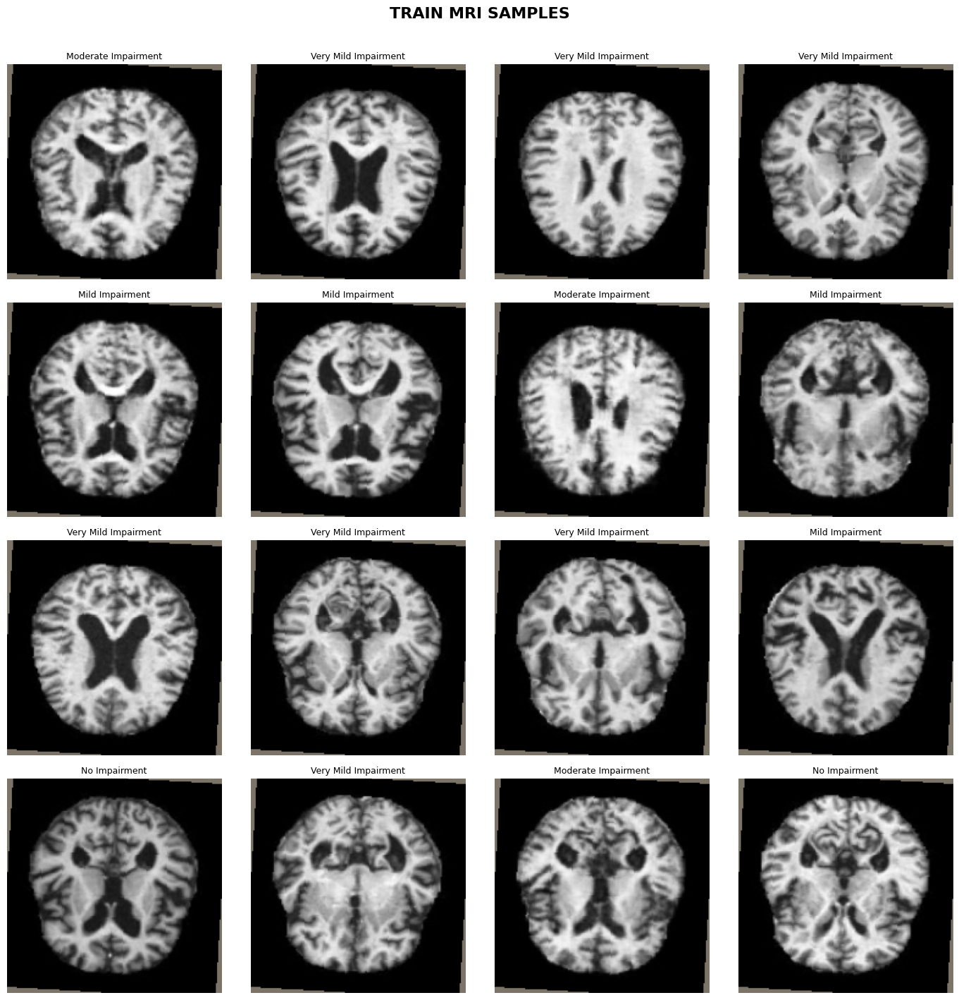

In [19]:
# ============================================================
# Denormalization Helper
# ============================================================
def denormalize(tensor, mean=MEAN, std=STD):
    img = tensor.clone().detach().cpu().numpy()
    for c in range(3):
        img[c] = img[c] * std[c] + mean[c]
    img = np.transpose(img, (1, 2, 0))
    return np.clip(img, 0, 1)

def visualize_samples(loader, class_names, title, rows=4, cols=4):
    images, labels, _ = next(iter(loader))
    plt.figure(figsize=(14, 14))
    plt.suptitle(title, fontsize=16, fontweight='bold', y=1.01)
    n = min(rows * cols, len(images))
    for i in range(n):
        plt.subplot(rows, cols, i + 1)
        plt.imshow(denormalize(images[i]), cmap="gray")
        plt.title(class_names[labels[i]], fontsize=9)
        plt.axis("off")
    plt.tight_layout()
    plt.show()

visualize_samples(train_loader, CLASS_NAMES, "TRAIN MRI SAMPLES")

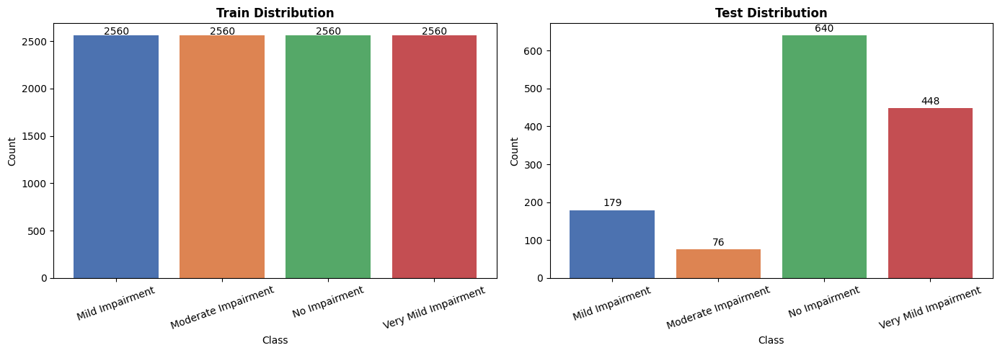

PHASE 5 COMPLETED


In [20]:
# ============================================================
# Dataset Distribution Bar Chart
# ============================================================
def get_distribution(dataset):
    counts = {c: 0 for c in dataset.class_names}
    for lbl in dataset.labels:
        counts[dataset.class_names[lbl]] += 1
    return counts

train_counts = get_distribution(train_dataset)
test_counts  = get_distribution(test_dataset)

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

for ax, counts, title in zip(axes,
                              [train_counts, test_counts],
                              ["Train Distribution", "Test Distribution"]):
    bars = ax.bar(counts.keys(), counts.values(), color=['#4C72B0','#DD8452','#55A868','#C44E52'])
    ax.set_title(title, fontweight='bold')
    ax.set_xlabel("Class")
    ax.set_ylabel("Count")
    ax.tick_params(axis='x', rotation=20)
    for bar in bars:
        ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 10,
                str(int(bar.get_height())), ha='center', fontsize=10)

plt.tight_layout()
plt.show()
print("PHASE 5 COMPLETED")

---
## PHASE 6 — Shared Training & Evaluation Engine
> These functions are used by all 7 models. Run once.

In [21]:
# ============================================================
# FIXED: Shared Training Engine
# Changes: (FIXED in this change request)
#   1. torch.amp instead of torch.cuda.amp (deprecation fix)
#   2. Handles InceptionV3 aux_logits tuple output during train mode
#   3. Correctly handles ReduceLROnPlateau scheduler.step(val_loss)
# ============================================================
import sys, shutil, os as _os
import torch.amp
import threading

def train_model(model, model_name, train_loader, val_loader,
                criterion, optimizer, scheduler=None, epochs=EPOCHS):

    local_path = f"/content/{model_name}_best.pth"
    drive_dir  = "/content/drive/MyDrive/defence/project dataset/Alzheimer MRI/saved_models"
    _os.makedirs(drive_dir, exist_ok=True)
    drive_path = f"{drive_dir}/{model_name}_best.pth"

    # Fixed: use torch.amp instead of deprecated torch.cuda.amp
    scaler = torch.amp.GradScaler('cuda')

    best_val_acc = 0.0
    train_losses, val_losses         = [], []
    train_accuracies, val_accuracies = [], []

    print(f"\n{'='*60}")
    print(f" TRAINING: {model_name}")
    print(f"{'='*60}")
    sys.stdout.flush()

    start_time = time.time()

    for epoch in range(epochs):
        # ── TRAIN ────────────────────────────────────────────
        model.train()
        running_loss, correct, total = 0.0, 0, 0

        for batch_idx, (images, labels, _) in enumerate(train_loader):
            images = images.to(device, non_blocking=True)
            labels = labels.to(device, non_blocking=True)

            optimizer.zero_grad(set_to_none=True)

            # Fixed: use torch.amp.autocast instead of deprecated version
            with torch.amp.autocast('cuda'):
                outputs = model(images)

                # FIX: InceptionV3 returns a named tuple (logits, aux_logits)
                # during training when aux_logits=True
                if isinstance(outputs, tuple):
                    logits, aux_logits_out = outputs[0], outputs[1]
                    loss = criterion(logits, labels)
                    if aux_logits_out is not None:
                        loss += 0.4 * criterion(aux_logits_out, labels)
                    outputs = logits  # use main logits for accuracy
                else:
                    loss = criterion(outputs, labels)

            scaler.scale(loss).backward()
            scaler.unscale_(optimizer)
            nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
            scaler.step(optimizer)
            scaler.update()

            running_loss += loss.item()
            _, predicted  = torch.max(outputs, 1)
            total        += labels.size(0)
            correct      += (predicted == labels).sum().item()

            if (batch_idx + 1) % 20 == 0:
                print(f"  Epoch {epoch+1}/{epochs} | Batch {batch_idx+1}/{len(train_loader)} | "
                      f"Loss: {running_loss/(batch_idx+1):.4f}", end='\r')
                sys.stdout.flush()

        train_loss = running_loss / len(train_loader)
        train_acc  = 100 * correct / total
        train_losses.append(train_loss)
        train_accuracies.append(train_acc)

        # ── VALIDATE ─────────────────────────────────────────
        model.eval()
        val_loss_sum, correct, total = 0.0, 0, 0
        with torch.no_grad():
            for images, labels, _ in val_loader:
                images = images.to(device, non_blocking=True)
                labels = labels.to(device, non_blocking=True)
                with torch.amp.autocast('cuda'):
                    outputs = model(images)
                    # In eval mode InceptionV3 returns plain tensor, but be safe
                    if isinstance(outputs, tuple):
                        outputs = outputs[0]
                    loss = criterion(outputs, labels)
                val_loss_sum += loss.item()
                _, predicted  = torch.max(outputs, 1)
                total        += labels.size(0)
                correct      += (predicted == labels).sum().item()

        val_loss = val_loss_sum / len(val_loader)
        val_acc  = 100 * correct / total
        val_losses.append(val_loss)
        val_accuracies.append(val_acc)

        # FIX: Correctly call scheduler.step() for ReduceLROnPlateau
        if scheduler:
            if isinstance(scheduler, optim.lr_scheduler.ReduceLROnPlateau):
                scheduler.step(val_loss) # Pass validation loss for ReduceLROnPlateau
            else:
                scheduler.step()         # For other schedulers like CosineAnnealingLR

        # ── SAVE BEST → local + Drive (non-blocking) ─────────
        saved = ""
        if val_acc > best_val_acc:
            best_val_acc = val_acc
            torch.save(model.state_dict(), local_path)
            def _copy():
                try:
                    shutil.copy2(local_path, drive_path)
                except:
                    pass
            threading.Thread(target=_copy, daemon=True).start()
            saved = "  <- Best Saved (local + Drive)"

        print(f"Epoch [{epoch+1:02d}/{epochs}]  "
              f"Train Loss: {train_loss:.4f}  Train Acc: {train_acc:.2f}%  "
              f"Val Loss: {val_loss:.4f}  Val Acc: {val_acc:.2f}%{saved}")
        sys.stdout.flush()

    elapsed = time.time() - start_time
    print(f"\nTraining Time : {elapsed/60:.1f} min")
    print(f"Best Val Acc  : {best_val_acc:.2f}%")
    print(f"Saved locally : {local_path}")
    print(f"Saved to Drive: {drive_path}")
    sys.stdout.flush()

    return {
        "train_losses"    : train_losses,
        "val_losses"      : val_losses,
        "train_accuracies": train_accuracies,
        "val_accuracies"  : val_accuracies,
        "best_val_acc"    : best_val_acc,
        "save_path"       : local_path,
        "drive_path"      : drive_path,
        "training_time"   : elapsed
    }

In [22]:
# ============================================================
# Evaluation Function (Test Set)
# ============================================================
def evaluate_model(model, test_loader, class_names, model_name):

    model.eval()
    all_preds, all_labels, all_probs = [], [], []

    with torch.no_grad():
        for images, labels, _ in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            probs   = torch.softmax(outputs, dim=1)
            _, preds = torch.max(outputs, 1)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            all_probs.extend(probs.cpu().numpy())

    all_preds  = np.array(all_preds)
    all_labels = np.array(all_labels)
    all_probs  = np.array(all_probs)

    accuracy = 100 * np.sum(all_preds == all_labels) / len(all_labels)

    print(f"\n{'='*60}")
    print(f" TEST EVALUATION: {model_name}")
    print(f"{'='*60}")
    print(f"\nTest Accuracy : {accuracy:.2f}%")
    print("\nClassification Report:\n")
    print(classification_report(all_labels, all_preds, target_names=class_names))

    return {
        "accuracy"  : accuracy,
        "preds"     : all_preds,
        "labels"    : all_labels,
        "probs"     : all_probs
    }

In [23]:
# ============================================================
# Cross-Session Result Storage (Google Drive)
# Saves only the small numbers PHASE 14 needs, so the comparison
# dashboard can be rebuilt in ANY future runtime/session without
# needing to retrain or re-hold every model in memory at once.
# ============================================================
import json

RESULTS_DIR = "/content/drive/MyDrive/defence/project dataset/Alzheimer MRI/saved_models/results"
os.makedirs(RESULTS_DIR, exist_ok=True)

def save_model_result(model_name, eval_dict, history_dict, mean_auc):
    """Call this once, right after evaluating a model (any session).
    Writes a tiny JSON to Drive so PHASE 14 can pick it up later,
    even in a completely different Colab runtime/day."""
    result = {
        "Model": model_name,
        "Test Accuracy (%)": float(eval_dict["accuracy"]),
        "Mean AUC": float(mean_auc),
        "Training Time (min)": float(history_dict["training_time"]) / 60,
        "Best Val Acc (%)": float(history_dict["best_val_acc"]),
    }
    path = f"{RESULTS_DIR}/{model_name.replace(' ', '_').replace('-', '_')}_result.json"
    with open(path, "w") as f:
        json.dump(result, f, indent=2)
    print(f"Saved -> {path}")

def load_all_model_results():
    """Reads every *_result.json in Drive and returns a DataFrame.
    Works from a totally fresh runtime — only needs Drive mounted."""
    rows = []
    for fname in sorted(os.listdir(RESULTS_DIR)):
        if fname.endswith("_result.json"):
            with open(os.path.join(RESULTS_DIR, fname)) as f:
                rows.append(json.load(f))
    if not rows:
        raise FileNotFoundError(
            f"No result files found in {RESULTS_DIR}. "
            "Evaluate at least one model first (this calls save_model_result())."
        )
    return pd.DataFrame(rows)


In [26]:
# ============================================================
# Plot Training Curves
# ============================================================
def plot_training_curves(history, model_name):

    fig, axes = plt.subplots(1, 2, figsize=(14, 5))
    fig.suptitle(f"{model_name} — Training Curves", fontsize=14, fontweight='bold')

    axes[0].plot(history["train_losses"],     label="Train Loss",     color='#4C72B0')
    axes[0].plot(history["val_losses"],       label="Val Loss",       color='#DD8452')
    axes[0].set_title("Loss")
    axes[0].set_xlabel("Epoch")
    axes[0].set_ylabel("Loss")
    axes[0].legend()
    axes[0].grid(True, alpha=0.3)

    axes[1].plot(history["train_accuracies"], label="Train Accuracy", color='#55A868')
    axes[1].plot(history["val_accuracies"],   label="Val Accuracy",   color='#C44E52')
    axes[1].set_title("Accuracy (%)")
    axes[1].set_xlabel("Epoch")
    axes[1].set_ylabel("Accuracy (%)")
    axes[1].legend()
    axes[1].grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

In [27]:
# ============================================================
# Plot Confusion Matrix
# ============================================================
def plot_confusion_matrix(eval_results, class_names, model_name):

    cm = confusion_matrix(eval_results["labels"], eval_results["preds"])

    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=class_names, yticklabels=class_names)
    plt.title(f"{model_name} — Confusion Matrix", fontweight='bold')
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.tight_layout()
    plt.show()

In [28]:
# ============================================================
# Plot ROC Curves (One-vs-Rest per class)
# ============================================================
def plot_roc_curves(eval_results, class_names, model_name):

    labels     = eval_results["labels"]
    probs      = eval_results["probs"]
    n_classes  = len(class_names)

    plt.figure(figsize=(9, 7))

    auc_scores = []
    for i, cls in enumerate(class_names):
        binary_labels = (labels == i).astype(int)
        fpr, tpr, _   = roc_curve(binary_labels, probs[:, i])
        roc_auc       = auc(fpr, tpr)
        auc_scores.append(roc_auc)
        plt.plot(fpr, tpr, label=f"{cls}  (AUC = {roc_auc:.4f})")

    plt.plot([0,1],[0,1],'k--', lw=1)
    plt.title(f"{model_name} — ROC Curves (One-vs-Rest)", fontweight='bold')
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.legend(loc='lower right')
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

    mean_auc = np.mean(auc_scores)
    print(f"Mean AUC: {mean_auc:.4f}")
    return mean_auc, auc_scores

In [29]:
# ============================================================
# Confidence Distribution Plot
# ============================================================
def plot_confidence_distribution(eval_results, class_names, model_name):

    probs  = eval_results["probs"]
    preds  = eval_results["preds"]
    labels = eval_results["labels"]

    max_conf = np.max(probs, axis=1)
    correct  = (preds == labels)

    plt.figure(figsize=(9, 5))
    plt.hist(max_conf[correct],  bins=30, alpha=0.7, label="Correct",   color='#55A868')
    plt.hist(max_conf[~correct], bins=30, alpha=0.7, label="Incorrect", color='#C44E52')
    plt.title(f"{model_name} — Confidence Distribution", fontweight='bold')
    plt.xlabel("Max Confidence Score")
    plt.ylabel("Count")
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

In [30]:
# ============================================================
# Error Analysis — Show Misclassified Samples
# ============================================================
def plot_error_analysis(model, test_loader, class_names, model_name, n_samples=8):

    model.eval()
    wrong_images, wrong_preds, wrong_labels = [], [], []

    with torch.no_grad():
        for images, labels, _ in test_loader:
            images_gpu, labels_gpu = images.to(device), labels.to(device)
            outputs  = model(images_gpu)
            _, preds = torch.max(outputs, 1)

            mask = (preds != labels_gpu)
            for i in range(len(mask)):
                if mask[i]:
                    wrong_images.append(images[i])
                    wrong_preds.append(preds[i].item())
                    wrong_labels.append(labels[i].item())

                if len(wrong_images) >= n_samples:
                    break
            if len(wrong_images) >= n_samples:
                break

    if not wrong_images:
        print("No misclassified samples found!")
        return

    cols = 4
    rows = (len(wrong_images) + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(14, rows * 3.5))
    fig.suptitle(f"{model_name} — Misclassified Samples", fontsize=13, fontweight='bold')
    axes = axes.flatten() if rows > 1 else [axes] if cols == 1 else axes

    for i in range(len(wrong_images)):
        img = denormalize(wrong_images[i])
        axes[i].imshow(img, cmap='gray')
        axes[i].set_title(
            f"True: {class_names[wrong_labels[i]]}\nPred: {class_names[wrong_preds[i]]}",
            fontsize=8, color='red'
        )
        axes[i].axis("off")

    for j in range(len(wrong_images), len(axes)):
        axes[j].axis("off")

    plt.tight_layout()
    plt.show()
    print(f"Total misclassified shown: {len(wrong_images)}")

In [31]:
# ============================================================
# Grad-CAM Visualization Function
# ============================================================
def run_gradcam(model, model_name, target_layer, test_loader,
                class_names, n_samples=8, reshape_transform=None):
    """
    Generates Grad-CAM heatmaps overlaid on MRI images.

    Parameters
    ----------
    model        : trained PyTorch model
    model_name   : string label for titles
    target_layer : the conv layer to hook  (e.g. model.features[-1])
    test_loader  : DataLoader
    class_names  : list of class name strings
    n_samples    : number of images to visualize
    """

    # Store original requires_grad states for ALL model parameters
    original_requires_grad_states = {}
    for name, param in model.named_parameters():
        original_requires_grad_states[name] = param.requires_grad
        param.requires_grad = True # Temporarily enable gradients for all

    model.eval()

    if reshape_transform is not None:
        # Needed for transformer backbones (ViT / Swin): reshapes the
        # (batch, tokens, channels) sequence back into a spatial
        # (batch, channels, H, W) map that Grad-CAM can operate on.
        cam = GradCAM(model=model, target_layers=[target_layer],
                      reshape_transform=reshape_transform)
    else:
        cam = GradCAM(model=model, target_layers=[target_layer])

    sample_images, sample_labels, _ = [], [], []
    collected = 0

    for images, labels, _ in test_loader:
        for i in range(len(images)):
            sample_images.append(images[i])
            sample_labels.append(labels[i].item())
            collected += 1
            if collected >= n_samples:
                break
        if collected >= n_samples:
            break

    cols = 4
    rows = (n_samples + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols * 2, figsize=(cols * 5, rows * 4))
    fig.suptitle(f"{model_name} — Grad-CAM Heatmaps", fontsize=14, fontweight='bold')

    for i in range(n_samples):
        img_tensor = sample_images[i].unsqueeze(0).to(device)
        true_label = sample_labels[i]

        # Forward pass to get prediction
        with torch.no_grad():
            output = model(img_tensor)
            pred_label = torch.argmax(output, dim=1).item()

        # Grad-CAM for predicted class
        targets   = [ClassifierOutputTarget(pred_label)]
        grayscale_cam = cam(input_tensor=img_tensor, targets=targets)[0]

        # Denormalize for overlay
        rgb_img = np.ascontiguousarray(denormalize(sample_images[i]).astype(np.float32))
        cam_image = show_cam_on_image(rgb_img, grayscale_cam, use_rgb=True)

        row  = i // cols
        col  = (i % cols) * 2

        # Original MRI
        axes[row, col].imshow(rgb_img, cmap='gray')
        axes[row, col].set_title(
            f"True: {class_names[true_label]}\nPred: {class_names[pred_label]}",
            fontsize=8,
            color='green' if true_label == pred_label else 'red'
        )
        axes[row, col].axis('off')

        # Grad-CAM Overlay
        axes[row, col + 1].imshow(cam_image)
        axes[row, col + 1].set_title("Grad-CAM", fontsize=8)
        axes[row, col + 1].axis('off')

    # Hide unused axes
    total_axes = rows * cols * 2
    for j in range(n_samples * 2, total_axes):
        r, c = divmod(j, cols * 2)
        axes[r, c].axis('off')

    plt.tight_layout()
    plt.show()
    print(f"Grad-CAM complete for {model_name}")

    # Restore original requires_grad states
    for name, param in model.named_parameters():
        param.requires_grad = original_requires_grad_states[name]


---
## PHASE 7 — Model 1: VGG16

In [32]:
# ============================================================
# VGG16 — Build Model
# ============================================================
MODEL_NAME = "VGG16"

vgg16 = models.vgg16(weights=models.VGG16_Weights.IMAGENET1K_V1)

# Freeze early layers, unfreeze last 2 conv blocks (features[24:])
for param in vgg16.features.parameters():
    param.requires_grad = False
for param in vgg16.features[24:].parameters():
    param.requires_grad = True

# Improved classifier head
vgg16.classifier[6] = nn.Sequential(
    nn.Linear(4096, 512),
    nn.ReLU(inplace=True),
    nn.Dropout(0.5),
    nn.Linear(512, NUM_CLASSES)
)

vgg16 = vgg16.to(device)
trainable = sum(p.numel() for p in vgg16.parameters() if p.requires_grad)
print(f"VGG16 trainable params: {trainable:,}")


Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth


100%|██████████| 528M/528M [01:01<00:00, 8.97MB/s]


VGG16 trainable params: 128,724,996


In [33]:
# Quick sanity check — run this before training
import sys
criterion = nn.CrossEntropyLoss() # Define criterion locally for this check
vgg16.train()
images, labels, _ = next(iter(train_loader))
images, labels = images.to(device), labels.to(device)
outputs = vgg16(images)
loss = criterion(outputs, labels)
loss.backward()
print("Forward + backward pass: OK")
print(f"Output shape: {outputs.shape}")
sys.stdout.flush()

Forward + backward pass: OK
Output shape: torch.Size([64, 4])


In [34]:
import torch.optim as optim

# ============================================================
# VGG16 — Train
# ============================================================
criterion_vgg16  = nn.CrossEntropyLoss(label_smoothing=0.1)
optimizer_vgg16  = optim.AdamW(
    filter(lambda p: p.requires_grad, vgg16.parameters()),
    lr=3e-4, weight_decay=1e-4
)
scheduler_vgg16  = optim.lr_scheduler.CosineAnnealingLR(
    optimizer_vgg16, T_max=EPOCHS, eta_min=1e-6
)

history_vgg16 = train_model(
    model=vgg16, model_name=MODEL_NAME,
    train_loader=train_loader, val_loader=val_loader,
    criterion=criterion_vgg16, optimizer=optimizer_vgg16,
    scheduler=scheduler_vgg16, epochs=EPOCHS
)



 TRAINING: VGG16
Epoch [01/20]  Train Loss: 1.1709  Train Acc: 55.02%  Val Loss: 0.8035  Val Acc: 72.85%  <- Best Saved (local + Drive)
Epoch [02/20]  Train Loss: 0.8649  Train Acc: 70.00%  Val Loss: 0.7880  Val Acc: 73.00%  <- Best Saved (local + Drive)
Epoch [03/20]  Train Loss: 0.7637  Train Acc: 76.49%  Val Loss: 0.7954  Val Acc: 72.56%
Epoch [04/20]  Train Loss: 0.7740  Train Acc: 76.11%  Val Loss: 0.7124  Val Acc: 77.00%  <- Best Saved (local + Drive)
Epoch [05/20]  Train Loss: 0.7203  Train Acc: 79.61%  Val Loss: 0.6320  Val Acc: 83.25%  <- Best Saved (local + Drive)
Epoch [06/20]  Train Loss: 0.6971  Train Acc: 80.08%  Val Loss: 0.6925  Val Acc: 80.66%
Epoch [07/20]  Train Loss: 0.6684  Train Acc: 82.21%  Val Loss: 0.6448  Val Acc: 83.84%  <- Best Saved (local + Drive)
Epoch [08/20]  Train Loss: 0.6374  Train Acc: 84.08%  Val Loss: 0.5794  Val Acc: 86.87%  <- Best Saved (local + Drive)
Epoch [09/20]  Train Loss: 0.6177  Train Acc: 85.13%  Val Loss: 0.5927  Val Acc: 85.89%
Epoc


 TEST EVALUATION: VGG16

Test Accuracy : 88.31%

Classification Report:

                      precision    recall  f1-score   support

     Mild Impairment       0.93      0.87      0.90       179
 Moderate Impairment       0.98      0.84      0.91        76
       No Impairment       0.89      0.92      0.91       640
Very Mild Impairment       0.84      0.84      0.84       448

            accuracy                           0.88      1343
           macro avg       0.91      0.87      0.89      1343
        weighted avg       0.88      0.88      0.88      1343



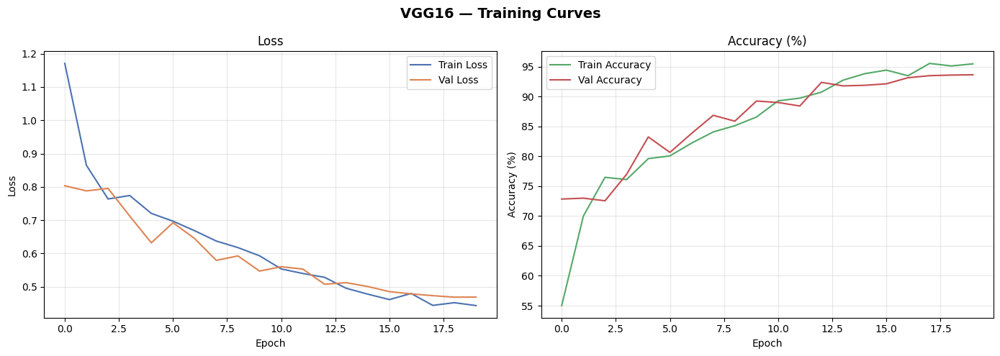

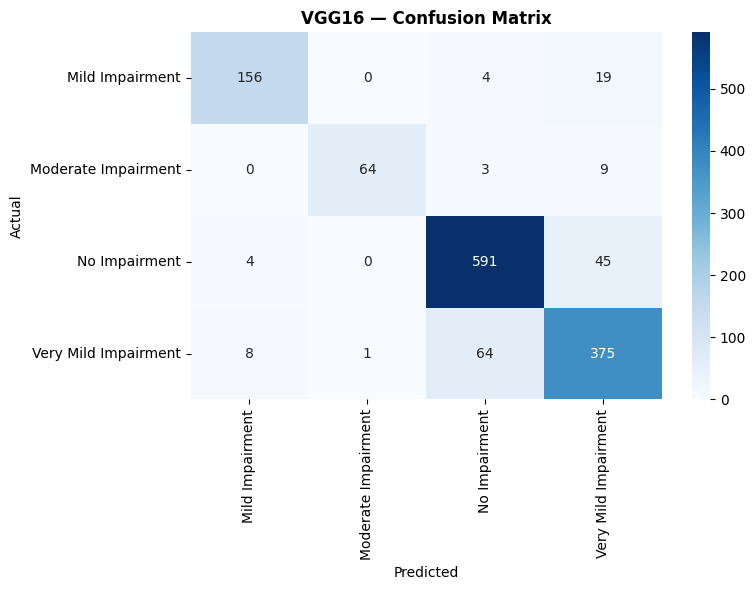

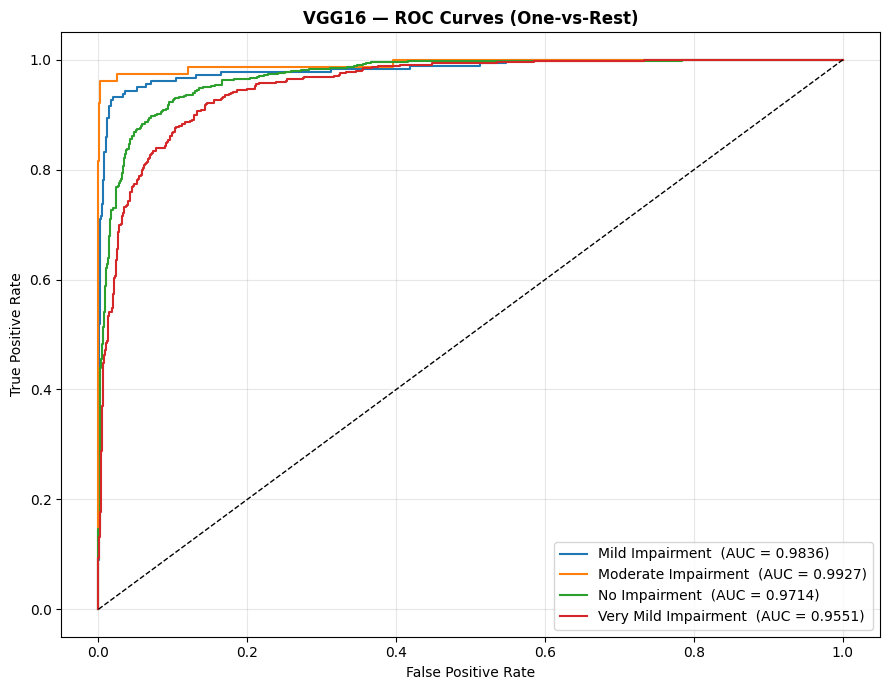

Mean AUC: 0.9757


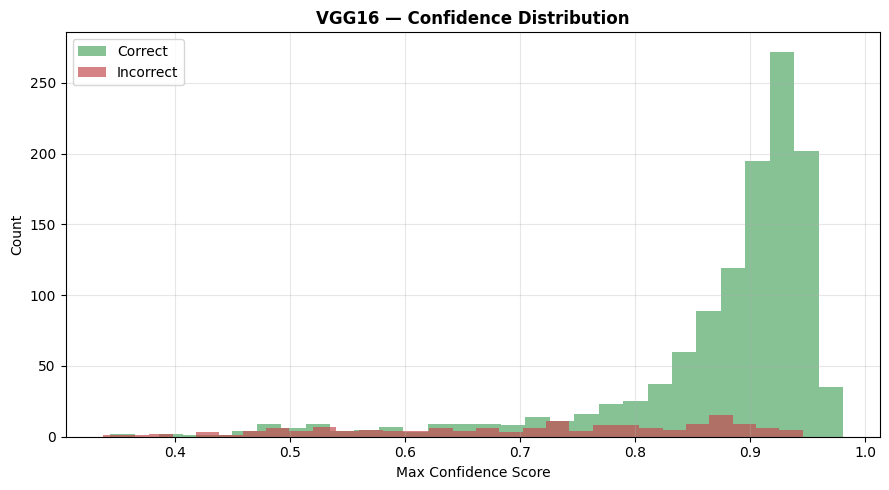

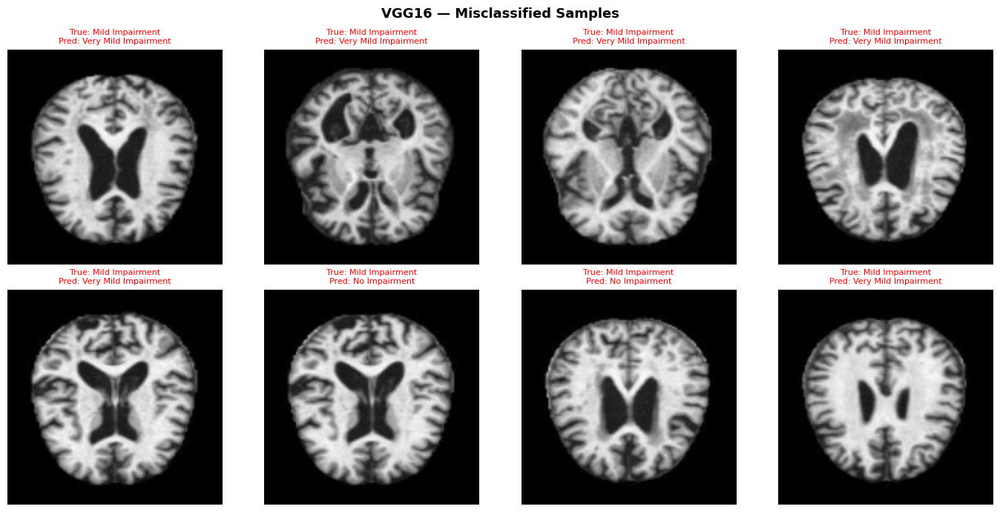

Total misclassified shown: 8


In [35]:
# ============================================================
# VGG16 — Load Best & Evaluate
# ============================================================
vgg16.load_state_dict(torch.load(history_vgg16["save_path"], map_location=device))

eval_vgg16 = evaluate_model(vgg16, test_loader, CLASS_NAMES, MODEL_NAME)
plot_training_curves(history_vgg16, MODEL_NAME)
plot_confusion_matrix(eval_vgg16, CLASS_NAMES, MODEL_NAME)
mean_auc_vgg16, auc_scores_vgg16 = plot_roc_curves(eval_vgg16, CLASS_NAMES, MODEL_NAME)
plot_confidence_distribution(eval_vgg16, CLASS_NAMES, MODEL_NAME)
plot_error_analysis(vgg16, test_loader, CLASS_NAMES, MODEL_NAME)

In [36]:
save_model_result("VGG16", eval_vgg16, history_vgg16, mean_auc_vgg16)


Saved -> /content/drive/MyDrive/defence/project dataset/Alzheimer MRI/saved_models/results/VGG16_result.json


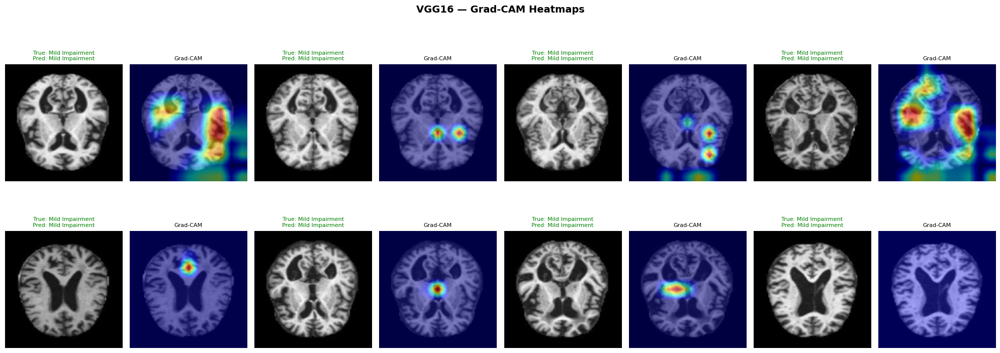

Grad-CAM complete for VGG16


In [37]:
# ============================================================
# VGG16 — Grad-CAM
# ============================================================
# Target layer: last conv block in VGG16 features
run_gradcam(
    model=vgg16,
    model_name=MODEL_NAME,
    target_layer=vgg16.features[-3],  # Conv2d layer before MaxPool
    test_loader=test_loader,
    class_names=CLASS_NAMES,
    n_samples=8
)

---
## PHASE 8 — Model 2: VGG19

In [38]:
# ============================================================
# VGG19 — Build Model
# ============================================================
MODEL_NAME = "VGG19"

vgg19 = models.vgg19(weights=models.VGG19_Weights.IMAGENET1K_V1)

for param in vgg19.features.parameters():
    param.requires_grad = False
for param in vgg19.features[28:].parameters():   # unfreeze last 2 blocks
    param.requires_grad = True

vgg19.classifier[6] = nn.Sequential(
    nn.Linear(4096, 512),
    nn.ReLU(inplace=True),
    nn.Dropout(0.5),
    nn.Linear(512, NUM_CLASSES)
)

vgg19 = vgg19.to(device)
trainable = sum(p.numel() for p in vgg19.parameters() if p.requires_grad)
print(f"VGG19 trainable params: {trainable:,}")


Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth


100%|██████████| 548M/548M [01:25<00:00, 6.73MB/s]


VGG19 trainable params: 131,084,804


In [39]:
# ============================================================
# VGG19 — Train
# ============================================================
criterion_vgg19  = nn.CrossEntropyLoss(label_smoothing=0.1)
optimizer_vgg19  = optim.AdamW(
    filter(lambda p: p.requires_grad, vgg19.parameters()),
    lr=3e-4, weight_decay=1e-4
)
scheduler_vgg19  = optim.lr_scheduler.CosineAnnealingLR(
    optimizer_vgg19, T_max=EPOCHS, eta_min=1e-6
)

history_vgg19 = train_model(
    model=vgg19, model_name=MODEL_NAME,
    train_loader=train_loader, val_loader=val_loader,
    criterion=criterion_vgg19, optimizer=optimizer_vgg19,
    scheduler=scheduler_vgg19, epochs=EPOCHS
)



 TRAINING: VGG19
Epoch [01/20]  Train Loss: 1.0518  Train Acc: 57.28%  Val Loss: 0.8354  Val Acc: 69.19%  <- Best Saved (local + Drive)
Epoch [02/20]  Train Loss: 0.8702  Train Acc: 70.04%  Val Loss: 0.7525  Val Acc: 74.46%  <- Best Saved (local + Drive)
Epoch [03/20]  Train Loss: 0.8178  Train Acc: 73.41%  Val Loss: 0.7078  Val Acc: 80.22%  <- Best Saved (local + Drive)
Epoch [04/20]  Train Loss: 0.7575  Train Acc: 76.97%  Val Loss: 0.6706  Val Acc: 80.42%  <- Best Saved (local + Drive)
Epoch [05/20]  Train Loss: 0.7247  Train Acc: 78.20%  Val Loss: 0.6737  Val Acc: 79.69%
Epoch [06/20]  Train Loss: 0.6917  Train Acc: 80.53%  Val Loss: 0.6650  Val Acc: 81.15%  <- Best Saved (local + Drive)
Epoch [07/20]  Train Loss: 0.6650  Train Acc: 81.97%  Val Loss: 0.6185  Val Acc: 84.33%  <- Best Saved (local + Drive)
Epoch [08/20]  Train Loss: 0.6435  Train Acc: 83.33%  Val Loss: 0.5928  Val Acc: 84.86%  <- Best Saved (local + Drive)
Epoch [09/20]  Train Loss: 0.6320  Train Acc: 83.69%  Val Los


 TEST EVALUATION: VGG19

Test Accuracy : 86.45%

Classification Report:

                      precision    recall  f1-score   support

     Mild Impairment       0.93      0.80      0.86       179
 Moderate Impairment       0.96      0.89      0.93        76
       No Impairment       0.88      0.90      0.89       640
Very Mild Impairment       0.80      0.83      0.81       448

            accuracy                           0.86      1343
           macro avg       0.89      0.86      0.87      1343
        weighted avg       0.87      0.86      0.86      1343



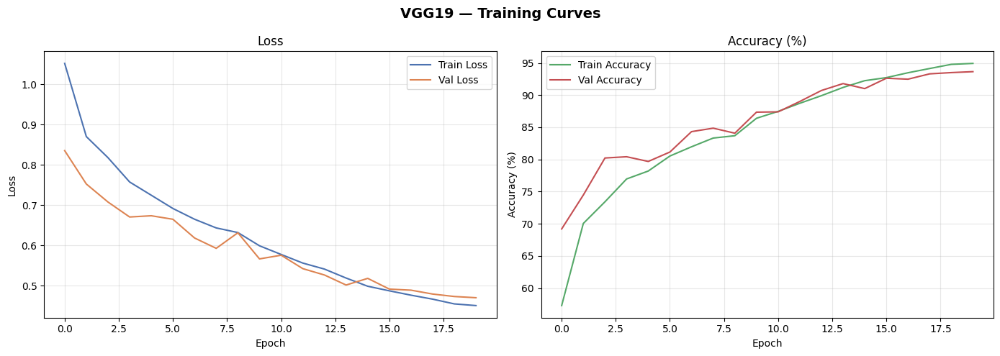

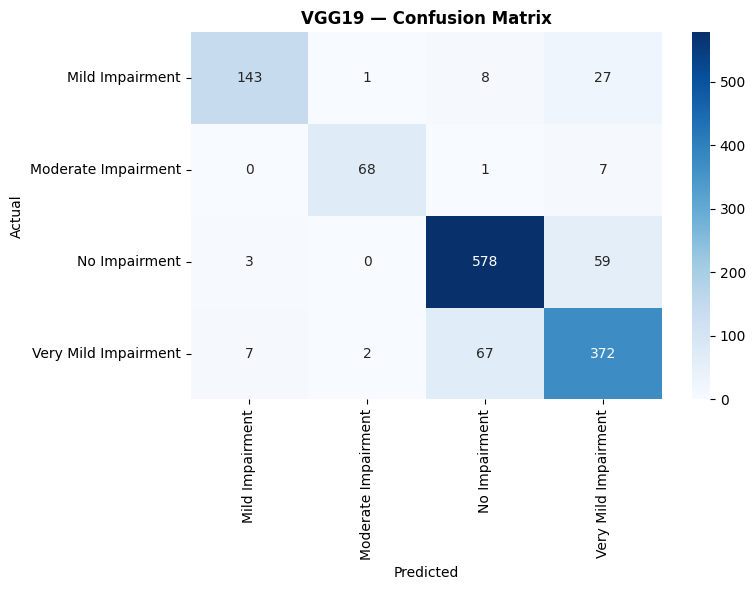

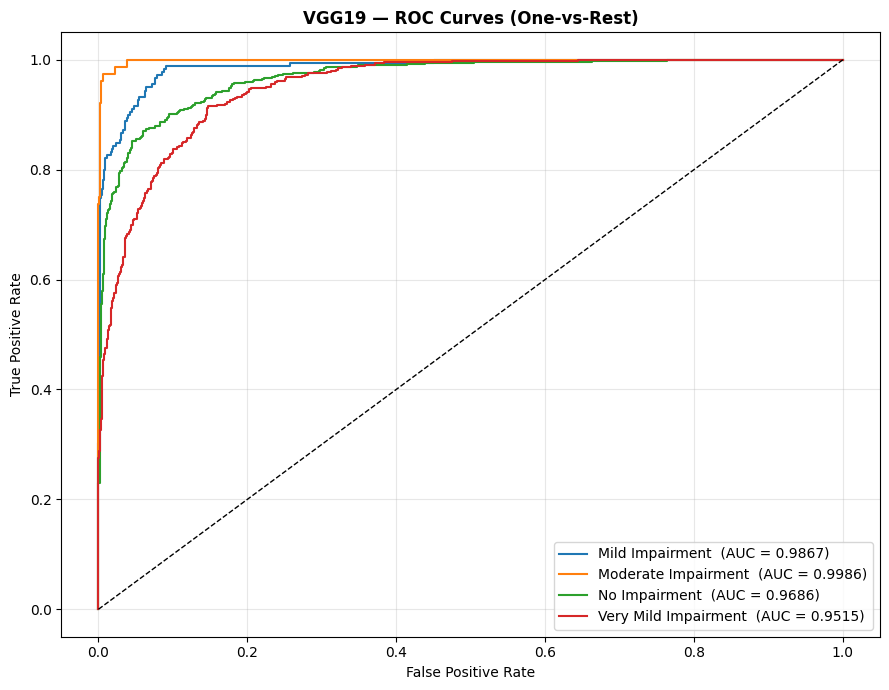

Mean AUC: 0.9763


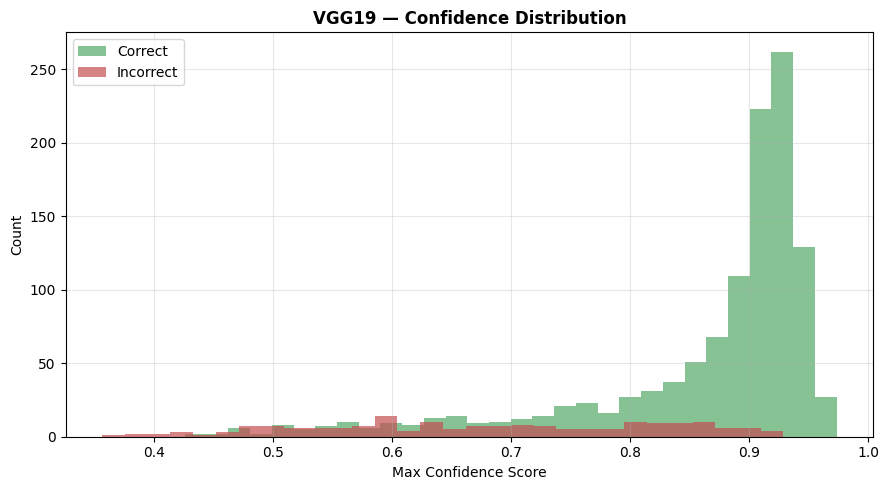

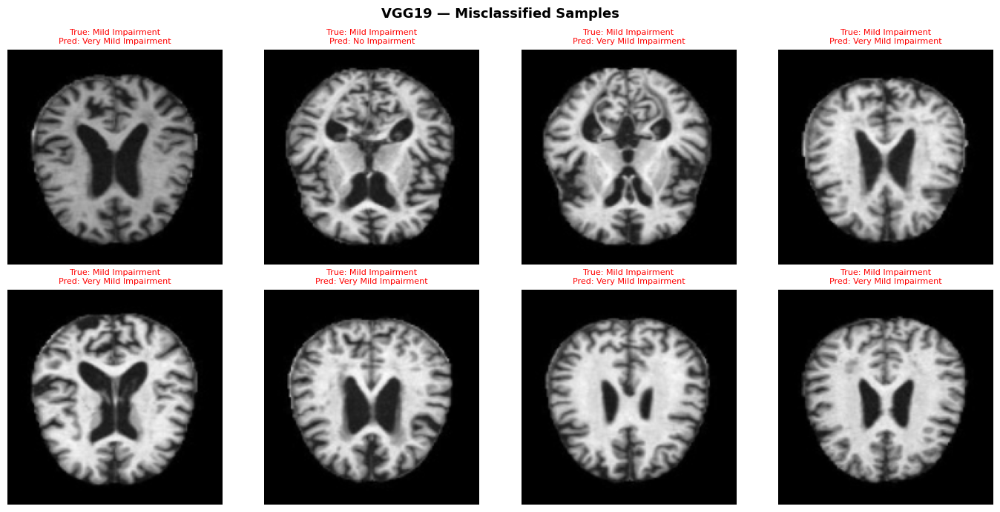

Total misclassified shown: 8


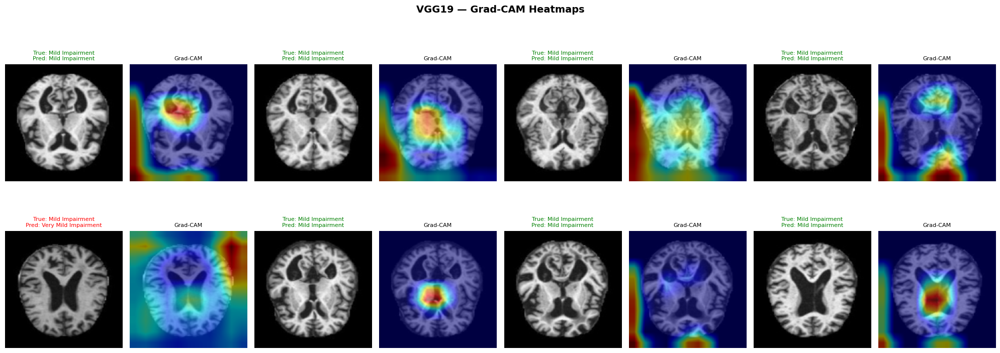

Grad-CAM complete for VGG19


In [40]:
# ============================================================
# VGG19 — Evaluate + Grad-CAM
# ============================================================
vgg19.load_state_dict(torch.load(history_vgg19["save_path"], map_location=device))

eval_vgg19 = evaluate_model(vgg19, test_loader, CLASS_NAMES, MODEL_NAME)
plot_training_curves(history_vgg19, MODEL_NAME)
plot_confusion_matrix(eval_vgg19, CLASS_NAMES, MODEL_NAME)
mean_auc_vgg19, auc_scores_vgg19 = plot_roc_curves(eval_vgg19, CLASS_NAMES, MODEL_NAME)
plot_confidence_distribution(eval_vgg19, CLASS_NAMES, MODEL_NAME)
plot_error_analysis(vgg19, test_loader, CLASS_NAMES, MODEL_NAME)

run_gradcam(vgg19, MODEL_NAME, vgg19.features[-3], test_loader, CLASS_NAMES)

In [41]:
save_model_result("VGG19", eval_vgg19, history_vgg19, mean_auc_vgg19)


Saved -> /content/drive/MyDrive/defence/project dataset/Alzheimer MRI/saved_models/results/VGG19_result.json


---
## PHASE 9 — Model 3: DenseNet121

In [42]:
# ============================================================
# DenseNet121 — Build Model
# ============================================================
MODEL_NAME = "DenseNet121"

densenet = models.densenet121(weights=models.DenseNet121_Weights.IMAGENET1K_V1)

# Freeze early, unfreeze denseblock3, denseblock4, norm5
for param in densenet.features.parameters():
    param.requires_grad = False
for param in densenet.features.denseblock3.parameters():
    param.requires_grad = True
for param in densenet.features.denseblock4.parameters():
    param.requires_grad = True
for param in densenet.features.norm5.parameters():
    param.requires_grad = True

densenet.classifier = nn.Sequential(
    nn.Linear(densenet.classifier.in_features, 512),
    nn.ReLU(inplace=True),
    nn.Dropout(0.4),
    nn.Linear(512, NUM_CLASSES)
)

densenet = densenet.to(device)
trainable = sum(p.numel() for p in densenet.parameters() if p.requires_grad)
print(f"DenseNet121 trainable params: {trainable:,}")


Downloading: "https://download.pytorch.org/models/densenet121-a639ec97.pth" to /root/.cache/torch/hub/checkpoints/densenet121-a639ec97.pth


100%|██████████| 30.8M/30.8M [00:02<00:00, 11.1MB/s]

DenseNet121 trainable params: 5,524,740


In [43]:
# ============================================================
# DenseNet121 — Train
# ============================================================
criterion_densenet = nn.CrossEntropyLoss(label_smoothing=0.1)
optimizer_densenet = optim.AdamW(
    filter(lambda p: p.requires_grad, densenet.parameters()),
    lr=3e-4, weight_decay=1e-4
)
scheduler_densenet = optim.lr_scheduler.CosineAnnealingLR(
    optimizer_densenet, T_max=EPOCHS, eta_min=1e-6
)

history_densenet = train_model(
    model=densenet, model_name=MODEL_NAME,
    train_loader=train_loader, val_loader=val_loader,
    criterion=criterion_densenet, optimizer=optimizer_densenet,
    scheduler=scheduler_densenet, epochs=EPOCHS
)



 TRAINING: DenseNet121
Epoch [01/20]  Train Loss: 0.8206  Train Acc: 72.22%  Val Loss: 0.8426  Val Acc: 70.51%  <- Best Saved (local + Drive)
Epoch [02/20]  Train Loss: 0.6836  Train Acc: 80.96%  Val Loss: 0.7801  Val Acc: 75.05%  <- Best Saved (local + Drive)
Epoch [03/20]  Train Loss: 0.6487  Train Acc: 83.01%  Val Loss: 0.8020  Val Acc: 73.00%
Epoch [04/20]  Train Loss: 0.5936  Train Acc: 86.90%  Val Loss: 0.6499  Val Acc: 82.96%  <- Best Saved (local + Drive)
Epoch [05/20]  Train Loss: 0.5602  Train Acc: 88.68%  Val Loss: 0.6763  Val Acc: 81.59%
Epoch [06/20]  Train Loss: 0.5347  Train Acc: 90.44%  Val Loss: 0.6921  Val Acc: 80.22%
Epoch [07/20]  Train Loss: 0.5153  Train Acc: 91.36%  Val Loss: 0.7133  Val Acc: 83.06%  <- Best Saved (local + Drive)
Epoch [08/20]  Train Loss: 0.4870  Train Acc: 93.27%  Val Loss: 0.9121  Val Acc: 71.88%
Epoch [09/20]  Train Loss: 0.4677  Train Acc: 94.34%  Val Loss: 0.7968  Val Acc: 77.25%
Epoch [10/20]  Train Loss: 0.4575  Train Acc: 94.71%  Val Lo


 TEST EVALUATION: DenseNet121

Test Accuracy : 88.91%

Classification Report:

                      precision    recall  f1-score   support

     Mild Impairment       0.87      0.97      0.92       179
 Moderate Impairment       1.00      0.61      0.75        76
       No Impairment       0.98      0.82      0.90       640
Very Mild Impairment       0.80      1.00      0.89       448

            accuracy                           0.89      1343
           macro avg       0.91      0.85      0.86      1343
        weighted avg       0.91      0.89      0.89      1343



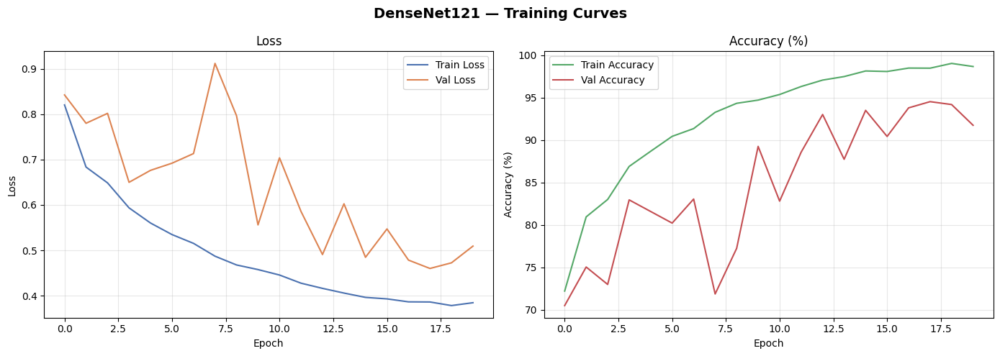

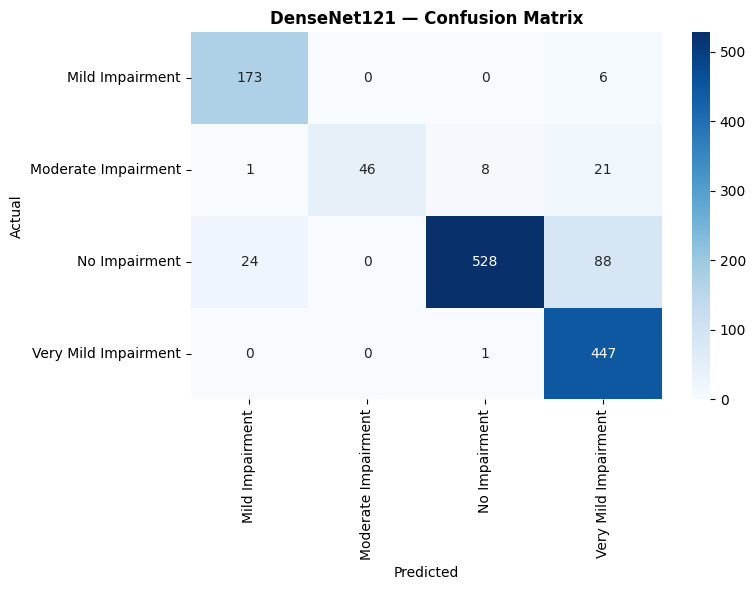

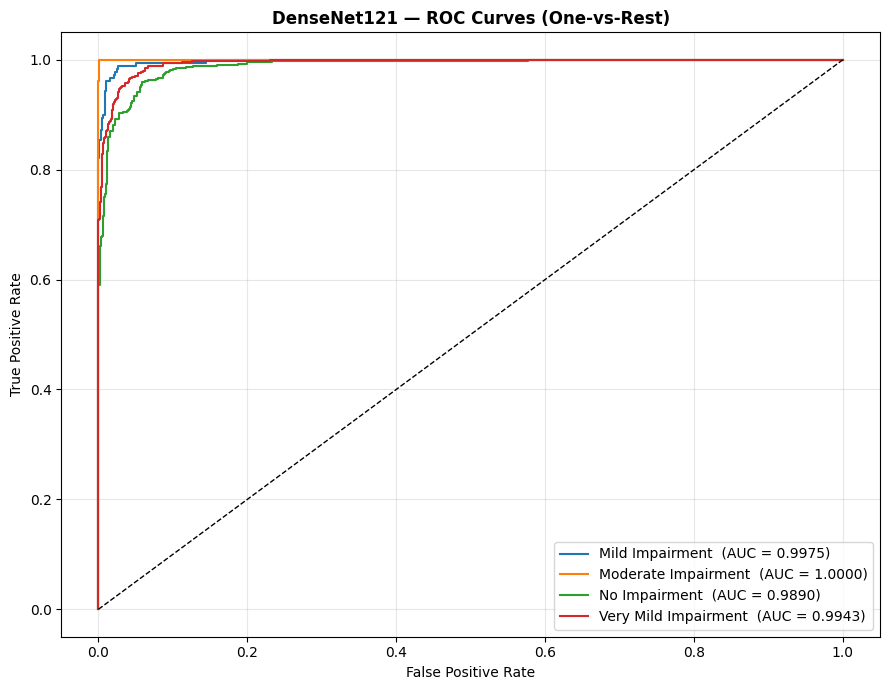

Mean AUC: 0.9952


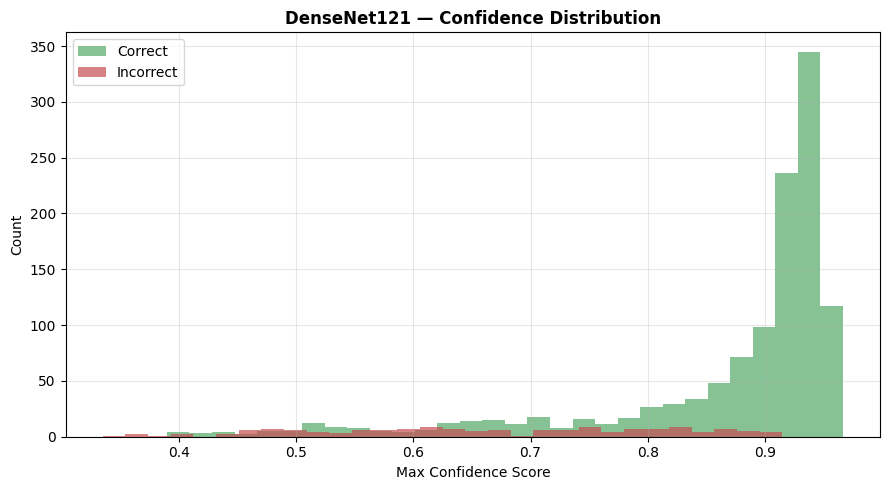

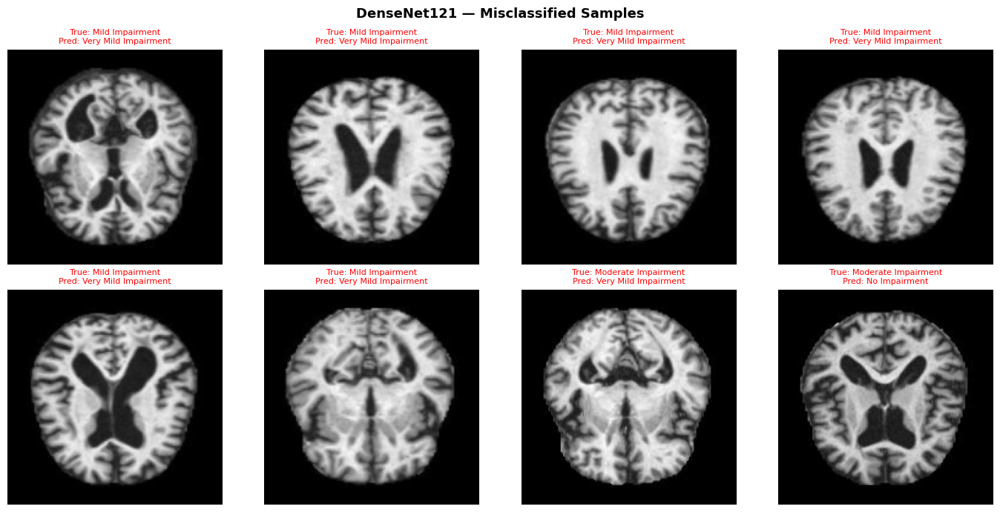

Total misclassified shown: 8


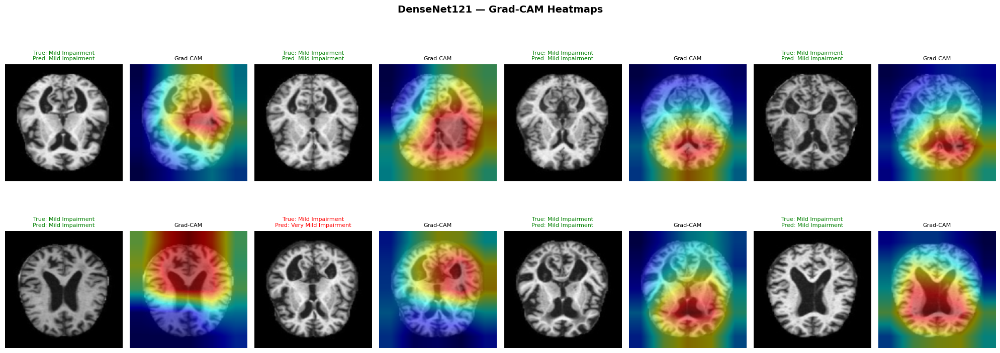

Grad-CAM complete for DenseNet121


In [44]:
# ============================================================
# DenseNet121 — Evaluate + Grad-CAM
# ============================================================
densenet.load_state_dict(torch.load(history_densenet["save_path"], map_location=device))

eval_densenet = evaluate_model(densenet, test_loader, CLASS_NAMES, MODEL_NAME)
plot_training_curves(history_densenet, MODEL_NAME)
plot_confusion_matrix(eval_densenet, CLASS_NAMES, MODEL_NAME)
mean_auc_densenet, auc_scores_densenet = plot_roc_curves(eval_densenet, CLASS_NAMES, MODEL_NAME)
plot_confidence_distribution(eval_densenet, CLASS_NAMES, MODEL_NAME)
plot_error_analysis(densenet, test_loader, CLASS_NAMES, MODEL_NAME)

# Grad-CAM target: last dense block's norm layer acts as proxy
run_gradcam(densenet, MODEL_NAME, densenet.features.denseblock4, test_loader, CLASS_NAMES)

In [45]:
save_model_result("DenseNet121", eval_densenet, history_densenet, mean_auc_densenet)


Saved -> /content/drive/MyDrive/defence/project dataset/Alzheimer MRI/saved_models/results/DenseNet121_result.json


---
## PHASE 10 — Model 4: InceptionV3

In [46]:
# ============================================================
# FIXED: InceptionV3 — Dedicated 299x299 DataLoaders
# Root cause: InceptionV3 needs >=299x299; 176x176 collapses
# spatial dims to 2x2 before a 5x5 conv → RuntimeError.
# Fix: build a separate loader that resizes to 299x299.
# ============================================================

INCEPTION_SIZE = 299

_inception_transform = T.Compose([
    T.Resize((INCEPTION_SIZE, INCEPTION_SIZE)),
    T.Normalize(mean=[0.0, 0.0, 0.0], std=[1.0, 1.0, 1.0])  # tensors already normalized
])

class InceptionTensorDataset(torch.utils.data.Dataset):
    """Re-sizes already-normalized tensors to 299x299 on the fly."""
    def __init__(self, base_dataset):
        self.base = base_dataset

    def __len__(self):
        return len(self.base)

    def __getitem__(self, idx):
        img, label, path = self.base[idx]
        img = T.functional.resize(img, [INCEPTION_SIZE, INCEPTION_SIZE],
                                  interpolation=T.InterpolationMode.BILINEAR,
                                  antialias=True)
        return img, label, path

# Wrap existing split datasets
inc_train_data = InceptionTensorDataset(train_data)
inc_val_data   = InceptionTensorDataset(val_data)
inc_test_data  = InceptionTensorDataset(test_dataset)

def standard_collate(batch):
    imgs, labels, paths = zip(*batch)
    return torch.stack(imgs), torch.tensor(labels, dtype=torch.long), list(paths)

inc_train_loader = DataLoader(inc_train_data, batch_size=32, shuffle=True,
                              num_workers=0, collate_fn=standard_collate, drop_last=True)
inc_val_loader   = DataLoader(inc_val_data,   batch_size=32, shuffle=False,
                              num_workers=0, collate_fn=standard_collate)
inc_test_loader  = DataLoader(inc_test_data,  batch_size=32, shuffle=False,
                              num_workers=0, collate_fn=standard_collate)

print(f"InceptionV3 loaders ready at {INCEPTION_SIZE}x{INCEPTION_SIZE}")
imgs, _, _ = next(iter(inc_train_loader))
print(f"Batch shape: {imgs.shape}")

InceptionV3 loaders ready at 299x299
Batch shape: torch.Size([32, 3, 299, 299])


In [47]:
# ============================================================
# FIXED: InceptionV3 — Build Model
# ============================================================
MODEL_NAME = "InceptionV3"

inception = models.inception_v3(
    weights=models.Inception_V3_Weights.IMAGENET1K_V1,
    aux_logits=True
)

# Freeze all; unfreeze Mixed_6e, Mixed_7a-c, fc, AuxLogits
for param in inception.parameters():
    param.requires_grad = False
for name, param in inception.named_parameters():
    if any(k in name for k in ["Mixed_6e", "Mixed_7a", "Mixed_7b", "Mixed_7c", "fc", "AuxLogits"]):
        param.requires_grad = True

# Replace main classifier head
inception.fc = nn.Sequential(
    nn.Linear(inception.fc.in_features, 512),
    nn.ReLU(inplace=True),
    nn.Dropout(0.5),
    nn.Linear(512, NUM_CLASSES)
)

# Replace aux classifier head (required when aux_logits=True)
inception.AuxLogits.fc = nn.Linear(768, NUM_CLASSES)

inception = inception.to(device)
trainable = sum(p.numel() for p in inception.parameters() if p.requires_grad)
print(f"InceptionV3 trainable params: {trainable:,}")

Downloading: "https://download.pytorch.org/models/inception_v3_google-0cc3c7bd.pth" to /root/.cache/torch/hub/checkpoints/inception_v3_google-0cc3c7bd.pth


100%|██████████| 104M/104M [00:12<00:00, 8.83MB/s]


InceptionV3 trainable params: 18,573,576


In [48]:
# ============================================================
# FIXED: InceptionV3 — Train (uses 299x299 loaders)
# ============================================================
criterion_inception = nn.CrossEntropyLoss(label_smoothing=0.1)
optimizer_inception = optim.AdamW(
    filter(lambda p: p.requires_grad, inception.parameters()),
    lr=3e-4, weight_decay=1e-4
)
scheduler_inception = optim.lr_scheduler.CosineAnnealingLR(
    optimizer_inception, T_max=EPOCHS, eta_min=1e-6
)

history_inception = train_model(
    model=inception, model_name=MODEL_NAME,
    train_loader=inc_train_loader,   # ← 299x299 loaders
    val_loader=inc_val_loader,
    criterion=criterion_inception, optimizer=optimizer_inception,
    scheduler=scheduler_inception, epochs=EPOCHS
)


 TRAINING: InceptionV3
Epoch [01/20]  Train Loss: 1.0036  Train Acc: 78.44%  Val Loss: 0.5802  Val Acc: 86.87%  <- Best Saved (local + Drive)
Epoch [02/20]  Train Loss: 0.7119  Train Acc: 91.98%  Val Loss: 0.5043  Val Acc: 91.75%  <- Best Saved (local + Drive)
Epoch [03/20]  Train Loss: 0.5934  Train Acc: 96.70%  Val Loss: 0.4680  Val Acc: 93.85%  <- Best Saved (local + Drive)
Epoch [04/20]  Train Loss: 0.5535  Train Acc: 98.25%  Val Loss: 0.4471  Val Acc: 95.51%  <- Best Saved (local + Drive)
Epoch [05/20]  Train Loss: 0.5264  Train Acc: 99.32%  Val Loss: 0.4540  Val Acc: 94.87%
Epoch [06/20]  Train Loss: 0.5164  Train Acc: 99.50%  Val Loss: 0.4200  Val Acc: 96.34%  <- Best Saved (local + Drive)
Epoch [07/20]  Train Loss: 0.5096  Train Acc: 99.69%  Val Loss: 0.4714  Val Acc: 93.75%
Epoch [08/20]  Train Loss: 0.5048  Train Acc: 99.82%  Val Loss: 0.4146  Val Acc: 96.58%  <- Best Saved (local + Drive)
Epoch [09/20]  Train Loss: 0.5023  Train Acc: 99.93%  Val Loss: 0.4038  Val Acc: 96.88


 TEST EVALUATION: InceptionV3

Test Accuracy : 95.23%

Classification Report:

                      precision    recall  f1-score   support

     Mild Impairment       0.99      0.93      0.96       179
 Moderate Impairment       1.00      0.99      0.99        76
       No Impairment       0.94      0.98      0.96       640
Very Mild Impairment       0.95      0.92      0.93       448

            accuracy                           0.95      1343
           macro avg       0.97      0.95      0.96      1343
        weighted avg       0.95      0.95      0.95      1343



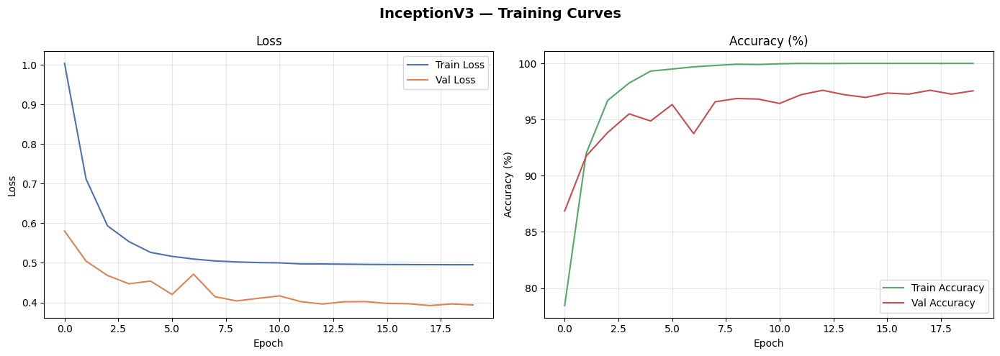

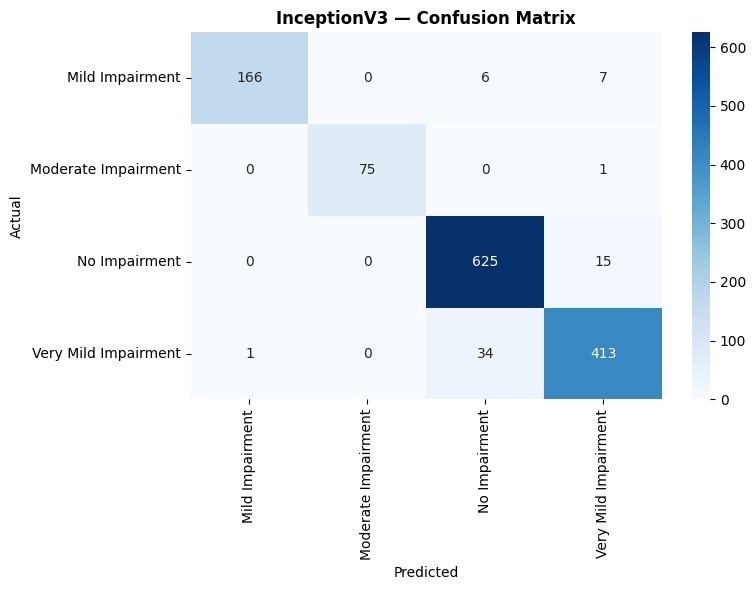

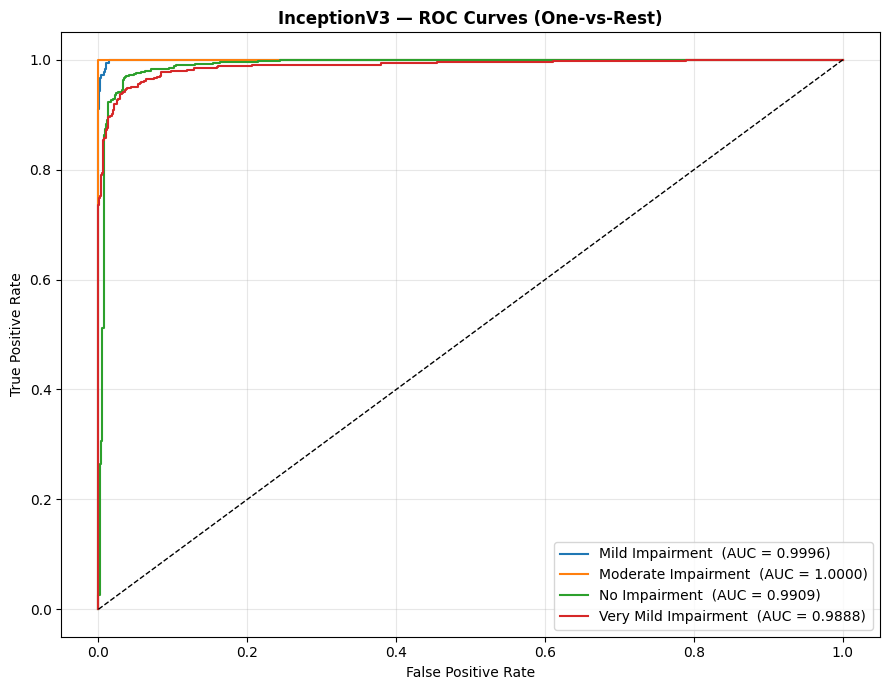

Mean AUC: 0.9948


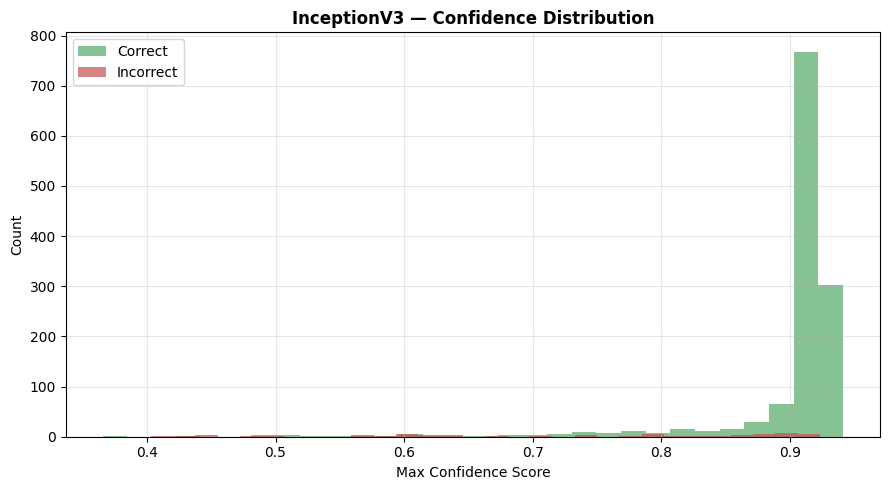

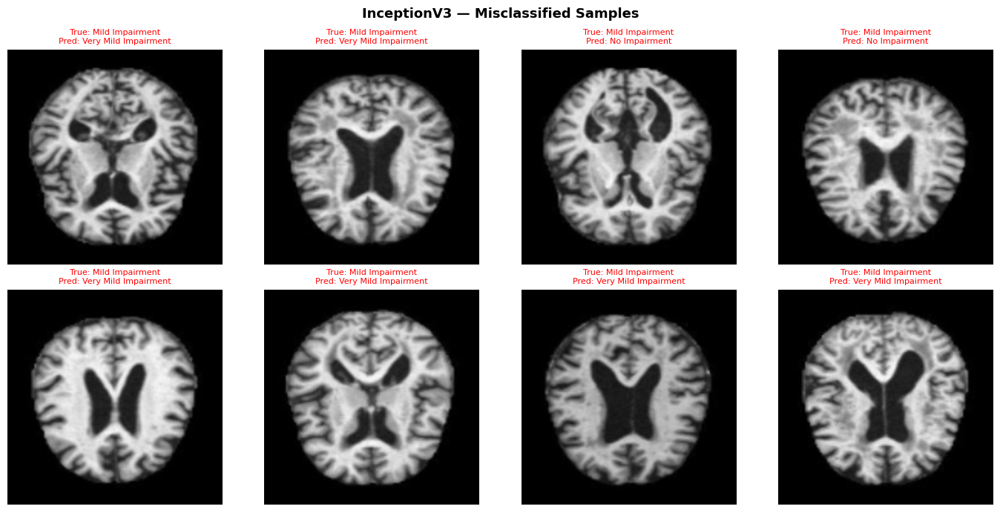

Total misclassified shown: 8


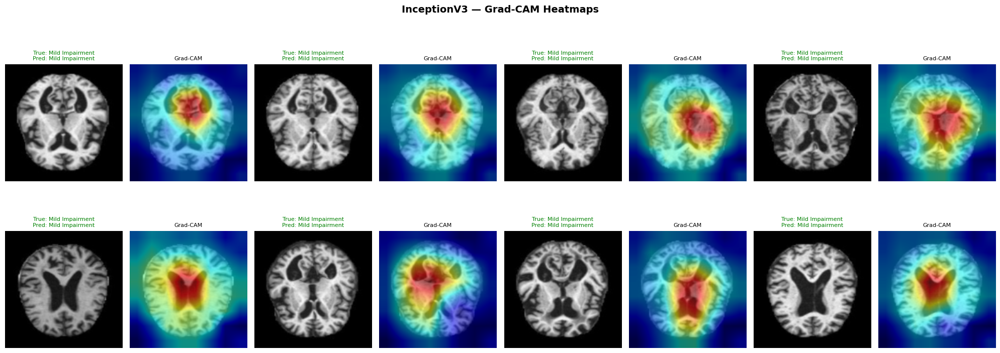

Grad-CAM complete for InceptionV3


In [49]:
# ============================================================
# FIXED: InceptionV3 — Evaluate + Grad-CAM (uses 299x299 test loader)
# ============================================================
inception.load_state_dict(torch.load(history_inception["save_path"], map_location=device))

eval_inception = evaluate_model(inception, inc_test_loader, CLASS_NAMES, MODEL_NAME)
plot_training_curves(history_inception, MODEL_NAME)
plot_confusion_matrix(eval_inception, CLASS_NAMES, MODEL_NAME)
mean_auc_inception, auc_scores_inception = plot_roc_curves(eval_inception, CLASS_NAMES, MODEL_NAME)
plot_confidence_distribution(eval_inception, CLASS_NAMES, MODEL_NAME)
plot_error_analysis(inception, inc_test_loader, CLASS_NAMES, MODEL_NAME)

run_gradcam(inception, MODEL_NAME, inception.Mixed_7c, inc_test_loader, CLASS_NAMES)

In [50]:
save_model_result("InceptionV3", eval_inception, history_inception, mean_auc_inception)


Saved -> /content/drive/MyDrive/defence/project dataset/Alzheimer MRI/saved_models/results/InceptionV3_result.json


---
## PHASE 11 — Model 5: ConvNeXt-Tiny

In [51]:
# ============================================================
# 224x224 DataLoaders — shared by ConvNeXt-Tiny, ViT, and Swin
# Root cause: these three architectures are pretrained on 224x224
# ImageNet crops (16x16 / 4x4 patch grids need to divide 224 evenly),
# while our base pipeline tensors are 176x176. Reusing the InceptionV3
# pattern: wrap the existing (already-normalized) tensors and resize
# them on the fly, instead of rebuilding the dataset from raw images.
# ============================================================

RESIZE_224 = 224

class Resized224Dataset(torch.utils.data.Dataset):
    """Resizes already-normalized tensors to 224x224 on the fly."""
    def __init__(self, base_dataset):
        self.base = base_dataset

    def __len__(self):
        return len(self.base)

    def __getitem__(self, idx):
        img, label, path = self.base[idx]
        img = T.functional.resize(img, [RESIZE_224, RESIZE_224],
                                  interpolation=T.InterpolationMode.BILINEAR,
                                  antialias=True)
        return img, label, path

r224_train_data = Resized224Dataset(train_data)
r224_val_data   = Resized224Dataset(val_data)
r224_test_data  = Resized224Dataset(test_dataset)

train_loader_224 = DataLoader(r224_train_data, batch_size=32, shuffle=True,
                              num_workers=0, collate_fn=standard_collate, drop_last=True)
val_loader_224   = DataLoader(r224_val_data,   batch_size=32, shuffle=False,
                              num_workers=0, collate_fn=standard_collate)
test_loader_224  = DataLoader(r224_test_data,  batch_size=32, shuffle=False,
                              num_workers=0, collate_fn=standard_collate)

print("224x224 loaders ready (shared by ConvNeXt-Tiny / ViT / Swin)")
imgs, _, _ = next(iter(train_loader_224))
print(f"Batch shape: {imgs.shape}")


224x224 loaders ready (shared by ConvNeXt-Tiny / ViT / Swin)
Batch shape: torch.Size([32, 3, 224, 224])


In [52]:
# ============================================================
# ConvNeXt-Tiny — Build Model
#
# Overfitting/underfitting considerations for this model:
#   - Backbone is frozen except the LAST stage (stages.3) + head, so
#     most of the ImageNet-pretrained feature hierarchy is preserved
#     (low risk of overfitting the ~10-12k image MRI set) while the
#     high-level features can still adapt to MRI-specific texture.
#   - drop_path_rate=0.1 adds stochastic depth regularization, which
#     ConvNeXt was designed to use during fine-tuning.
#   - Same AdamW + weight_decay + label_smoothing + batch augmentation
#     already used for the other CNN models applies here too.
# ============================================================
MODEL_NAME = "ConvNeXt_Tiny"

convnext = timm.create_model(
    "convnext_tiny",
    pretrained=True,
    num_classes=NUM_CLASSES,
    drop_path_rate=0.1
)

for param in convnext.parameters():
    param.requires_grad = False
for name, param in convnext.named_parameters():
    if any(k in name for k in ["stages.3", "head", "norm_pre"]):
        param.requires_grad = True

convnext = convnext.to(device)
trainable = sum(p.numel() for p in convnext.parameters() if p.requires_grad)
print(f"ConvNeXt-Tiny trainable params: {trainable:,}")


model.safetensors:   0%|          | 0.00/114M [00:00<?, ?B/s]

ConvNeXt-Tiny trainable params: 15,475,204


In [53]:
# ============================================================
# ConvNeXt-Tiny — Train
# ============================================================
criterion_convnext = nn.CrossEntropyLoss(label_smoothing=0.1)
optimizer_convnext = optim.AdamW(
    filter(lambda p: p.requires_grad, convnext.parameters()),
    lr=2e-4, weight_decay=1e-4
)
scheduler_convnext = optim.lr_scheduler.CosineAnnealingLR(
    optimizer_convnext, T_max=EPOCHS, eta_min=1e-6
)

history_convnext = train_model(
    model=convnext, model_name=MODEL_NAME,
    train_loader=train_loader_224, val_loader=val_loader_224,
    criterion=criterion_convnext, optimizer=optimizer_convnext,
    scheduler=scheduler_convnext, epochs=EPOCHS
)



 TRAINING: ConvNeXt_Tiny
Epoch [01/20]  Train Loss: 0.9550  Train Acc: 67.86%  Val Loss: 0.6884  Val Acc: 79.88%  <- Best Saved (local + Drive)
Epoch [02/20]  Train Loss: 0.6738  Train Acc: 80.75%  Val Loss: 0.6089  Val Acc: 85.21%  <- Best Saved (local + Drive)
Epoch [03/20]  Train Loss: 0.5719  Train Acc: 87.71%  Val Loss: 0.5394  Val Acc: 89.11%  <- Best Saved (local + Drive)
Epoch [04/20]  Train Loss: 0.4954  Train Acc: 91.94%  Val Loss: 0.5340  Val Acc: 90.77%  <- Best Saved (local + Drive)
Epoch [05/20]  Train Loss: 0.4529  Train Acc: 94.36%  Val Loss: 0.4432  Val Acc: 95.41%  <- Best Saved (local + Drive)
Epoch [06/20]  Train Loss: 0.4244  Train Acc: 95.96%  Val Loss: 0.4817  Val Acc: 93.90%
Epoch [07/20]  Train Loss: 0.4180  Train Acc: 96.41%  Val Loss: 0.4237  Val Acc: 96.63%  <- Best Saved (local + Drive)
Epoch [08/20]  Train Loss: 0.4066  Train Acc: 96.91%  Val Loss: 0.4337  Val Acc: 95.95%
Epoch [09/20]  Train Loss: 0.3973  Train Acc: 97.44%  Val Loss: 0.3884  Val Acc: 98.


 TEST EVALUATION: ConvNeXt_Tiny

Test Accuracy : 97.99%

Classification Report:

                      precision    recall  f1-score   support

     Mild Impairment       0.99      0.97      0.98       179
 Moderate Impairment       1.00      1.00      1.00        76
       No Impairment       0.98      0.98      0.98       640
Very Mild Impairment       0.97      0.98      0.97       448

            accuracy                           0.98      1343
           macro avg       0.99      0.98      0.98      1343
        weighted avg       0.98      0.98      0.98      1343



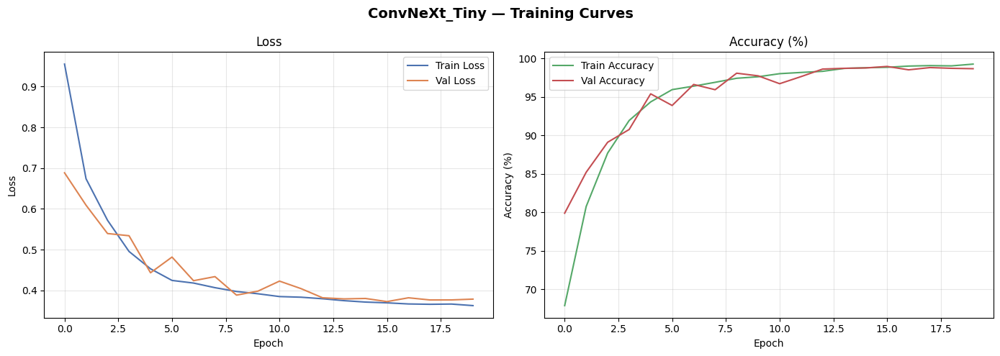

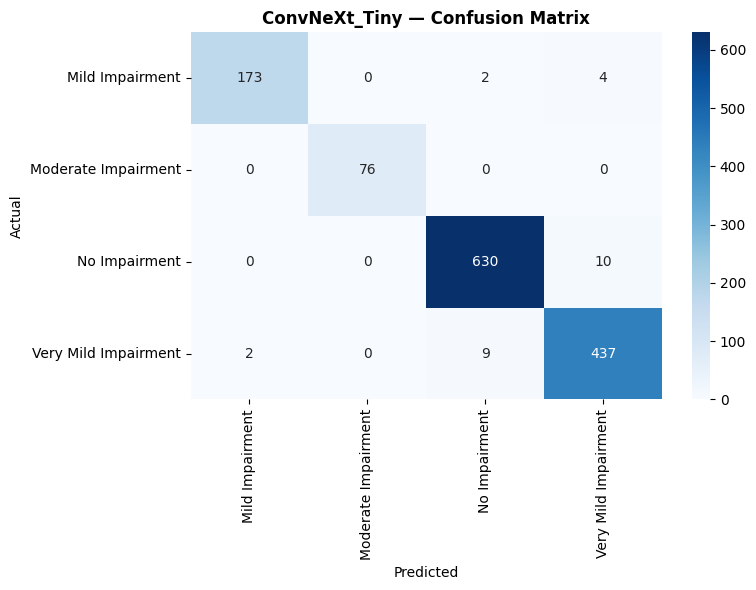

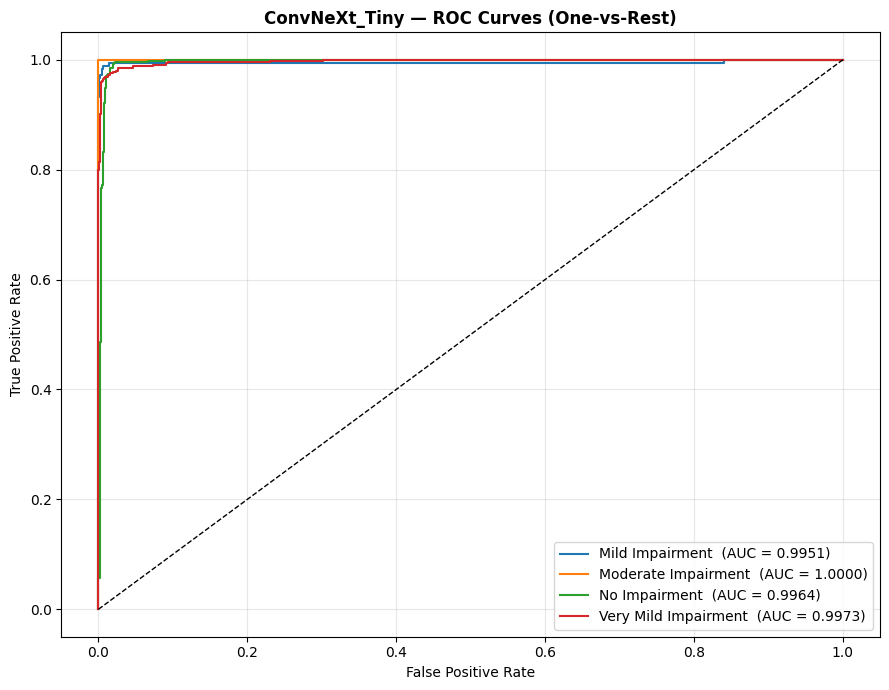

Mean AUC: 0.9972


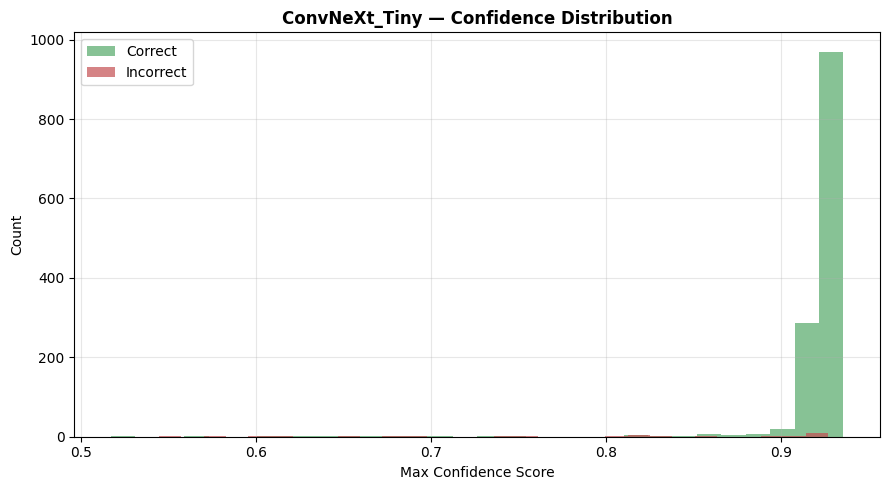

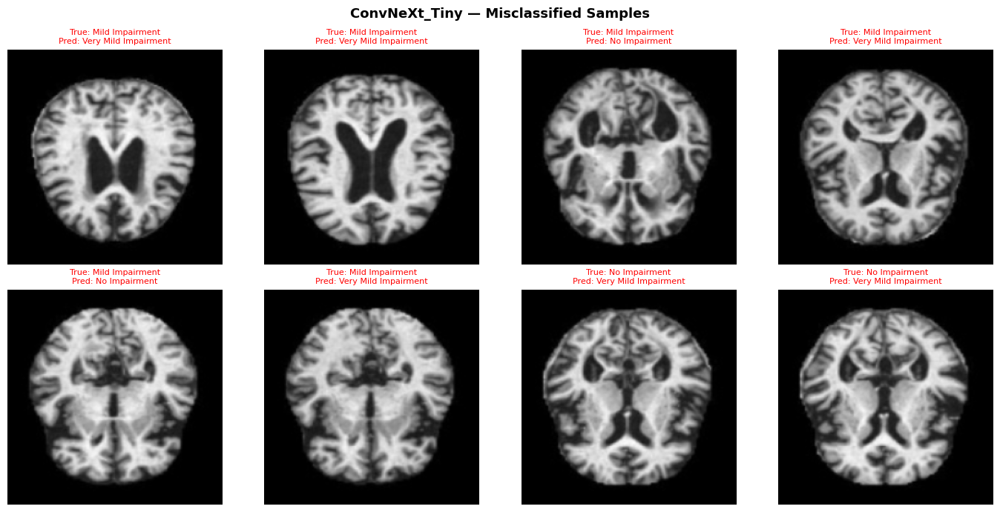

Total misclassified shown: 8


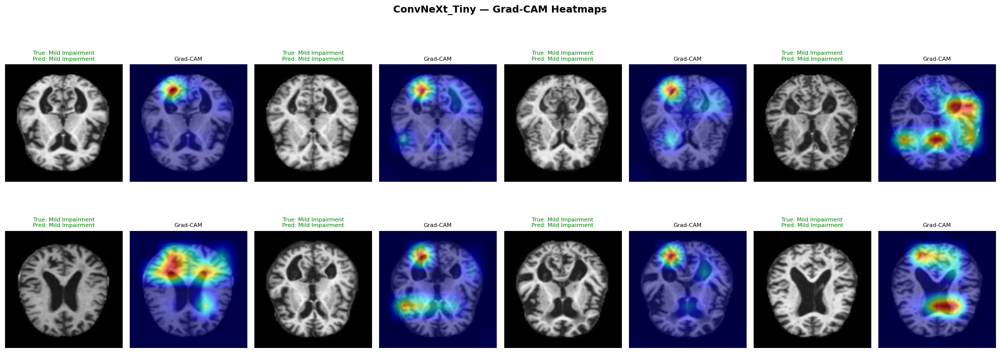

Grad-CAM complete for ConvNeXt_Tiny


In [54]:
# ============================================================
# ConvNeXt-Tiny — Evaluate + Grad-CAM
# ConvNeXt is a convolutional backbone (not tokens), so Grad-CAM works
# the same way as VGG/DenseNet — no reshape_transform needed.
# ============================================================
convnext.load_state_dict(torch.load(history_convnext["save_path"], map_location=device))

eval_convnext = evaluate_model(convnext, test_loader_224, CLASS_NAMES, MODEL_NAME)
plot_training_curves(history_convnext, MODEL_NAME)
plot_confusion_matrix(eval_convnext, CLASS_NAMES, MODEL_NAME)
mean_auc_convnext, auc_scores_convnext = plot_roc_curves(eval_convnext, CLASS_NAMES, MODEL_NAME)
plot_confidence_distribution(eval_convnext, CLASS_NAMES, MODEL_NAME)
plot_error_analysis(convnext, test_loader_224, CLASS_NAMES, MODEL_NAME)

run_gradcam(convnext, MODEL_NAME, convnext.stages[-1], test_loader_224, CLASS_NAMES)


In [55]:
save_model_result("ConvNeXt-Tiny", eval_convnext, history_convnext, mean_auc_convnext)


Saved -> /content/drive/MyDrive/defence/project dataset/Alzheimer MRI/saved_models/results/ConvNeXt_Tiny_result.json


---
## PHASE 12 — Model 6: Vision Transformer (ViT)

In [56]:
# ============================================================
# ViT-Small (patch16, 224) — Build Model
#
# Overfitting/underfitting considerations:
#   - vit_small (not vit_base) is used deliberately: fewer parameters
#     means lower overfitting risk on a dataset this size.
#   - Only the last 2 transformer blocks + final norm + head are
#     unfrozen. ViT attention weights are sensitive to fine-tuning;
#     unfreezing the whole network on ~10k images tends to overfit
#     or destabilize the pretrained attention patterns.
#   - drop_rate / attn_drop_rate add dropout inside the MLP and
#     attention blocks as extra regularization.
#   - Learning rate is much lower than the CNN models (5e-5 vs 3e-4):
#     ViTs fine-tune best with small LR — too high causes the
#     pretrained attention maps to collapse (underfitting/instability),
#     too low barely updates the head (underfitting).
# ============================================================
MODEL_NAME = "ViT_Small"

vit = timm.create_model(
    "vit_small_patch16_224",
    pretrained=True,
    num_classes=NUM_CLASSES,
    drop_rate=0.2,
    attn_drop_rate=0.1
)

for param in vit.parameters():
    param.requires_grad = False
for name, param in vit.named_parameters():
    if any(k in name for k in ["blocks.10", "blocks.11", "norm", "head"]):
        param.requires_grad = True

vit = vit.to(device)
trainable = sum(p.numel() for p in vit.parameters() if p.requires_grad)
print(f"ViT-Small trainable params: {trainable:,}")


model.safetensors:   0%|          | 0.00/88.2M [00:00<?, ?B/s]

ViT-Small trainable params: 3,566,596


In [57]:
# ============================================================
# ViT-Small — Train
# ============================================================
criterion_vit = nn.CrossEntropyLoss(label_smoothing=0.1)
optimizer_vit = optim.AdamW(
    filter(lambda p: p.requires_grad, vit.parameters()),
    lr=5e-5, weight_decay=1e-4
)
scheduler_vit = optim.lr_scheduler.CosineAnnealingLR(
    optimizer_vit, T_max=EPOCHS, eta_min=1e-6
)

history_vit = train_model(
    model=vit, model_name=MODEL_NAME,
    train_loader=train_loader_224, val_loader=val_loader_224,
    criterion=criterion_vit, optimizer=optimizer_vit,
    scheduler=scheduler_vit, epochs=EPOCHS
)



 TRAINING: ViT_Small
Epoch [01/20]  Train Loss: 0.9963  Train Acc: 63.32%  Val Loss: 0.7701  Val Acc: 74.51%  <- Best Saved (local + Drive)
Epoch [02/20]  Train Loss: 0.7645  Train Acc: 76.37%  Val Loss: 0.7111  Val Acc: 79.59%  <- Best Saved (local + Drive)
Epoch [03/20]  Train Loss: 0.6921  Train Acc: 80.40%  Val Loss: 0.6674  Val Acc: 81.59%  <- Best Saved (local + Drive)
Epoch [04/20]  Train Loss: 0.6456  Train Acc: 83.72%  Val Loss: 0.6343  Val Acc: 83.74%  <- Best Saved (local + Drive)
Epoch [05/20]  Train Loss: 0.6065  Train Acc: 86.22%  Val Loss: 0.6260  Val Acc: 84.81%  <- Best Saved (local + Drive)
Epoch [06/20]  Train Loss: 0.5763  Train Acc: 88.44%  Val Loss: 0.5937  Val Acc: 87.16%  <- Best Saved (local + Drive)
Epoch [07/20]  Train Loss: 0.5495  Train Acc: 89.61%  Val Loss: 0.5566  Val Acc: 88.67%  <- Best Saved (local + Drive)
Epoch [08/20]  Train Loss: 0.5238  Train Acc: 91.41%  Val Loss: 0.5461  Val Acc: 89.89%  <- Best Saved (local + Drive)
Epoch [09/20]  Train Loss:


 TEST EVALUATION: ViT_Small

Test Accuracy : 89.20%

Classification Report:

                      precision    recall  f1-score   support

     Mild Impairment       0.90      0.91      0.90       179
 Moderate Impairment       1.00      0.82      0.90        76
       No Impairment       0.91      0.92      0.91       640
Very Mild Impairment       0.85      0.86      0.86       448

            accuracy                           0.89      1343
           macro avg       0.92      0.88      0.89      1343
        weighted avg       0.89      0.89      0.89      1343



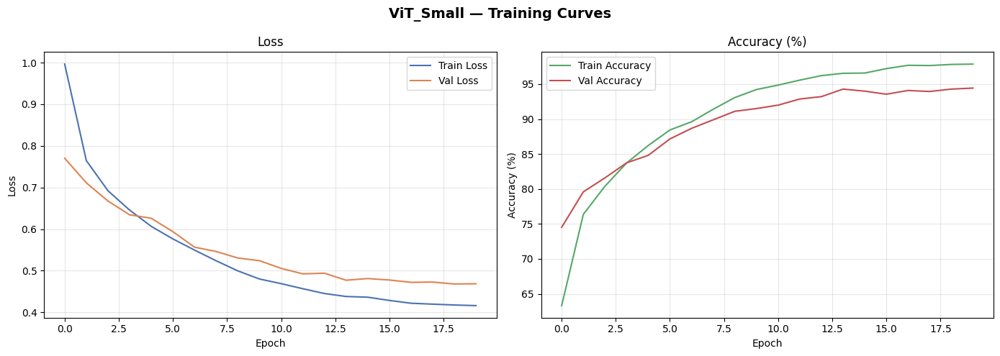

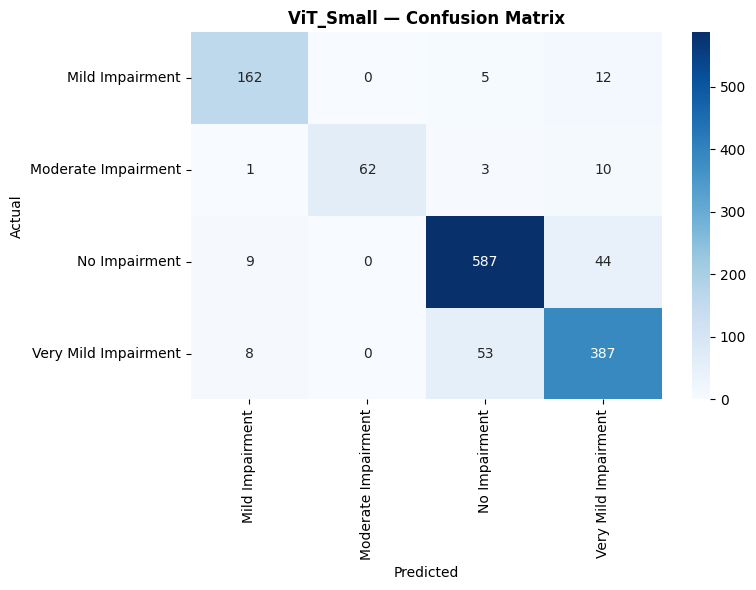

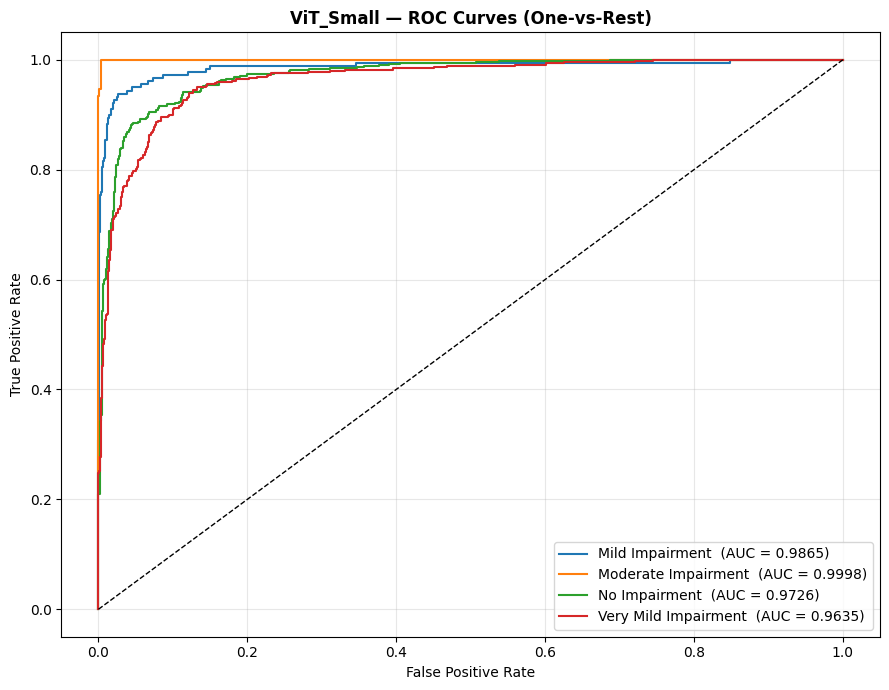

Mean AUC: 0.9806


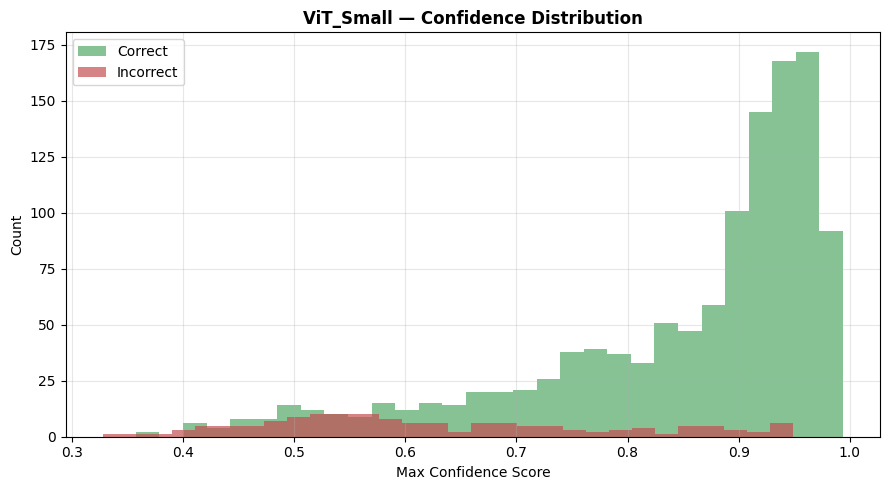

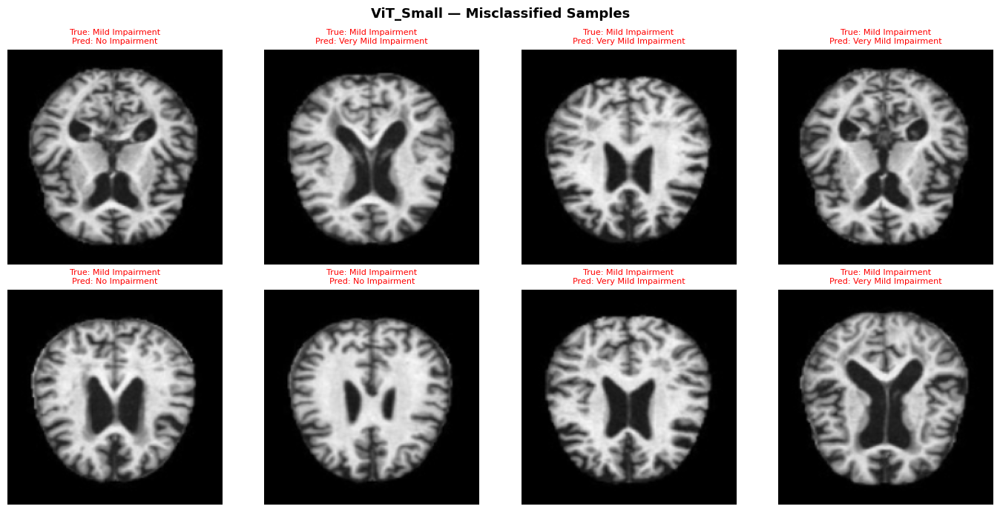

Total misclassified shown: 8


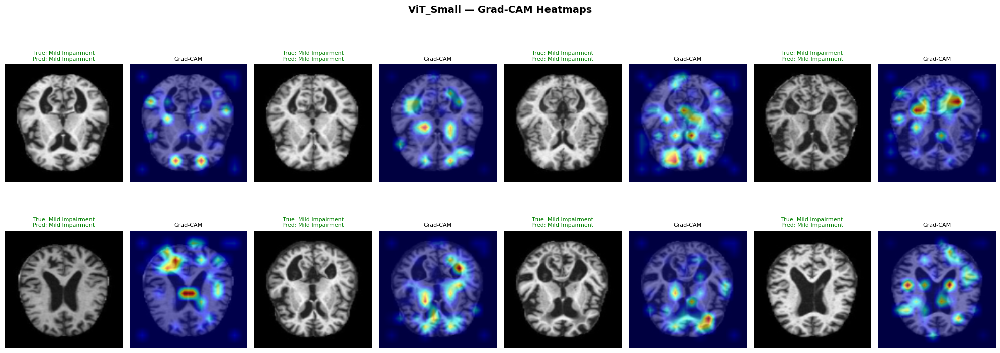

Grad-CAM complete for ViT_Small


In [58]:
# ============================================================
# ViT-Small — Evaluate + Grad-CAM
#
# ViT outputs a (batch, tokens, channels) sequence, not a spatial
# feature map, so standard Grad-CAM can't hook it directly. We use
# reshape_transform to drop the CLS token and fold the remaining
# 14x14=196 patch tokens back into a (batch, channels, 14, 14) map,
# targeting the last block's first LayerNorm (the standard choice
# recommended for ViT Grad-CAM).
# ============================================================
vit.load_state_dict(torch.load(history_vit["save_path"], map_location=device))

eval_vit = evaluate_model(vit, test_loader_224, CLASS_NAMES, MODEL_NAME)
plot_training_curves(history_vit, MODEL_NAME)
plot_confusion_matrix(eval_vit, CLASS_NAMES, MODEL_NAME)
mean_auc_vit, auc_scores_vit = plot_roc_curves(eval_vit, CLASS_NAMES, MODEL_NAME)
plot_confidence_distribution(eval_vit, CLASS_NAMES, MODEL_NAME)
plot_error_analysis(vit, test_loader_224, CLASS_NAMES, MODEL_NAME)

def reshape_transform_vit(tensor, height=14, width=14):
    # drop CLS token (index 0), fold the rest into a spatial grid
    result = tensor[:, 1:, :].reshape(tensor.size(0), height, width, tensor.size(2))
    result = result.transpose(2, 3).transpose(1, 2)  # -> (B, C, H, W)
    return result

run_gradcam(vit, MODEL_NAME, vit.blocks[-1].norm1, test_loader_224, CLASS_NAMES,
            reshape_transform=reshape_transform_vit)


In [59]:
save_model_result("ViT-Small", eval_vit, history_vit, mean_auc_vit)


Saved -> /content/drive/MyDrive/defence/project dataset/Alzheimer MRI/saved_models/results/ViT_Small_result.json


---
## PHASE 13 — Model 7: Swin Transformer

In [60]:
# ============================================================
# Swin-Tiny (patch4, window7, 224) — Build Model
#
# Overfitting/underfitting considerations:
#   - Only the last stage (layers.3) + final norm + head are unfrozen,
#     same reasoning as ConvNeXt/ViT above — Swin's windowed attention
#     in early stages encodes fairly generic local texture that
#     transfers well and doesn't need to be retrained.
#   - drop_rate + drop_path_rate regularize the MLP and stochastic
#     depth respectively.
#   - Low LR (5e-5), same rationale as ViT: Swin is also a transformer
#     and is sensitive to aggressive fine-tuning LRs.
# ============================================================
MODEL_NAME = "Swin_Tiny"

swin = timm.create_model(
    "swin_tiny_patch4_window7_224",
    pretrained=True,
    num_classes=NUM_CLASSES,
    drop_rate=0.2,
    drop_path_rate=0.1
)

for param in swin.parameters():
    param.requires_grad = False
for name, param in swin.named_parameters():
    if any(k in name for k in ["layers.3", "norm", "head"]):
        param.requires_grad = True

swin = swin.to(device)
trainable = sum(p.numel() for p in swin.parameters() if p.requires_grad)
print(f"Swin-Tiny trainable params: {trainable:,}")


model.safetensors:   0%|          | 0.00/114M [00:00<?, ?B/s]

Swin-Tiny trainable params: 15,385,204


In [61]:
# ============================================================
# Swin-Tiny — Train
# ============================================================
criterion_swin = nn.CrossEntropyLoss(label_smoothing=0.1)
optimizer_swin = optim.AdamW(
    filter(lambda p: p.requires_grad, swin.parameters()),
    lr=5e-5, weight_decay=1e-4
)
scheduler_swin = optim.lr_scheduler.CosineAnnealingLR(
    optimizer_swin, T_max=EPOCHS, eta_min=1e-6
)

history_swin = train_model(
    model=swin, model_name=MODEL_NAME,
    train_loader=train_loader_224, val_loader=val_loader_224,
    criterion=criterion_swin, optimizer=optimizer_swin,
    scheduler=scheduler_swin, epochs=EPOCHS
)



 TRAINING: Swin_Tiny
Epoch [01/20]  Train Loss: 0.8493  Train Acc: 70.12%  Val Loss: 0.7039  Val Acc: 79.10%  <- Best Saved (local + Drive)
Epoch [02/20]  Train Loss: 0.6930  Train Acc: 79.66%  Val Loss: 0.6365  Val Acc: 83.06%  <- Best Saved (local + Drive)
Epoch [03/20]  Train Loss: 0.6324  Train Acc: 83.76%  Val Loss: 0.5779  Val Acc: 86.43%  <- Best Saved (local + Drive)
Epoch [04/20]  Train Loss: 0.5812  Train Acc: 87.13%  Val Loss: 0.5683  Val Acc: 87.06%  <- Best Saved (local + Drive)
Epoch [05/20]  Train Loss: 0.5372  Train Acc: 90.11%  Val Loss: 0.5146  Val Acc: 90.92%  <- Best Saved (local + Drive)
Epoch [06/20]  Train Loss: 0.4969  Train Acc: 92.52%  Val Loss: 0.4863  Val Acc: 93.02%  <- Best Saved (local + Drive)
Epoch [07/20]  Train Loss: 0.4702  Train Acc: 94.35%  Val Loss: 0.4546  Val Acc: 94.92%  <- Best Saved (local + Drive)
Epoch [08/20]  Train Loss: 0.4522  Train Acc: 95.32%  Val Loss: 0.4362  Val Acc: 95.85%  <- Best Saved (local + Drive)
Epoch [09/20]  Train Loss:


 TEST EVALUATION: Swin_Tiny

Test Accuracy : 96.95%

Classification Report:

                      precision    recall  f1-score   support

     Mild Impairment       0.98      0.97      0.97       179
 Moderate Impairment       1.00      1.00      1.00        76
       No Impairment       0.96      0.98      0.97       640
Very Mild Impairment       0.97      0.95      0.96       448

            accuracy                           0.97      1343
           macro avg       0.98      0.97      0.98      1343
        weighted avg       0.97      0.97      0.97      1343



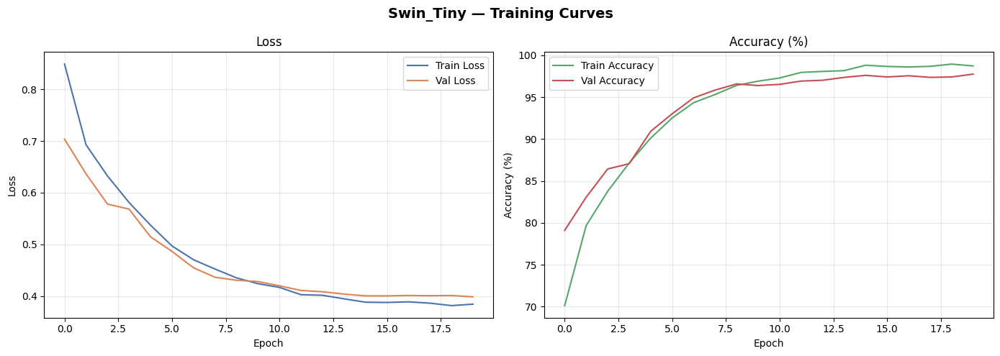

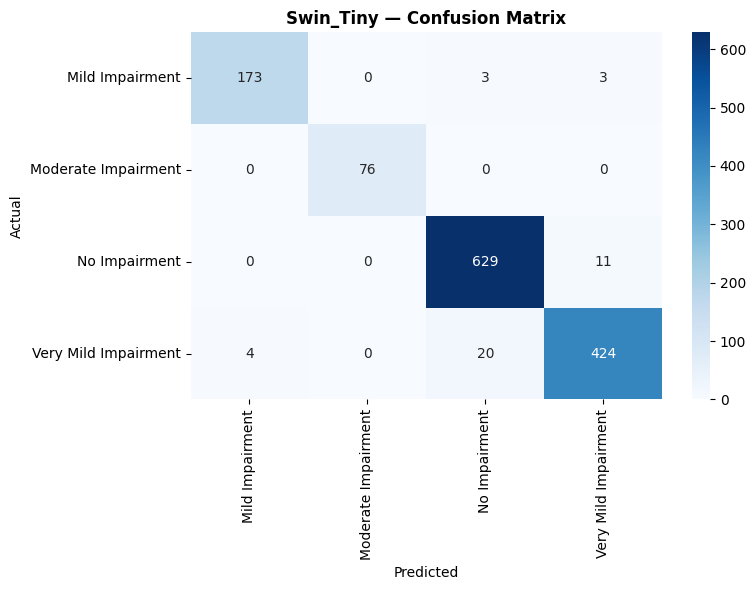

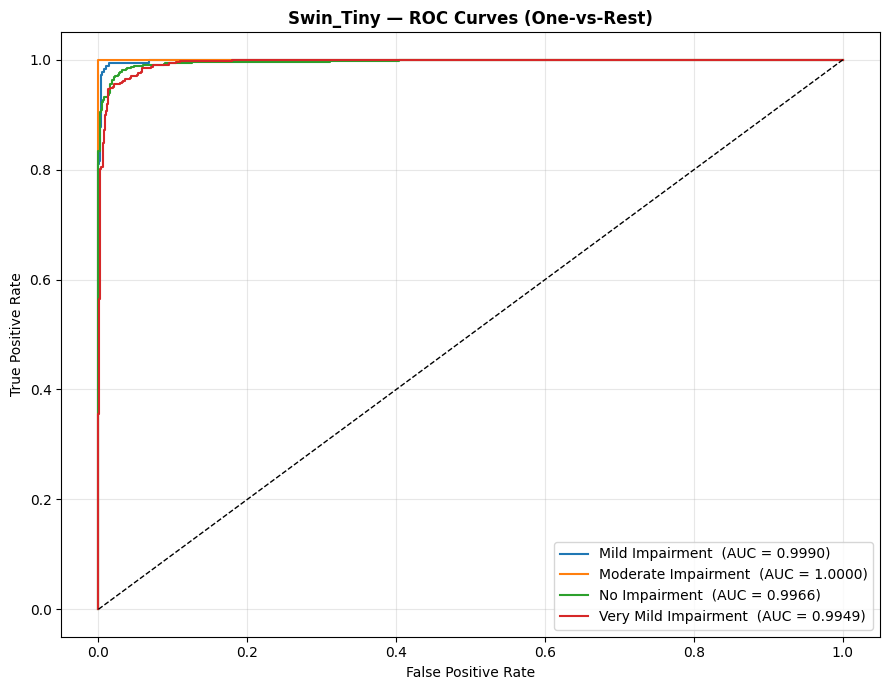

Mean AUC: 0.9976


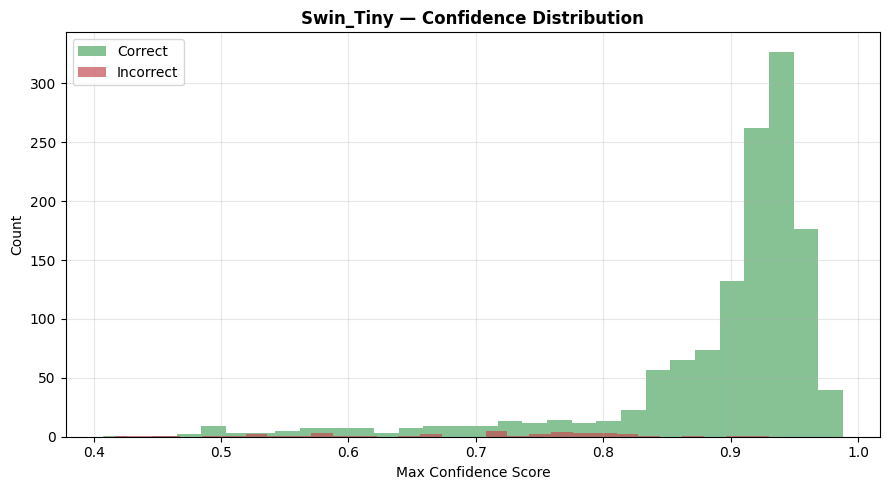

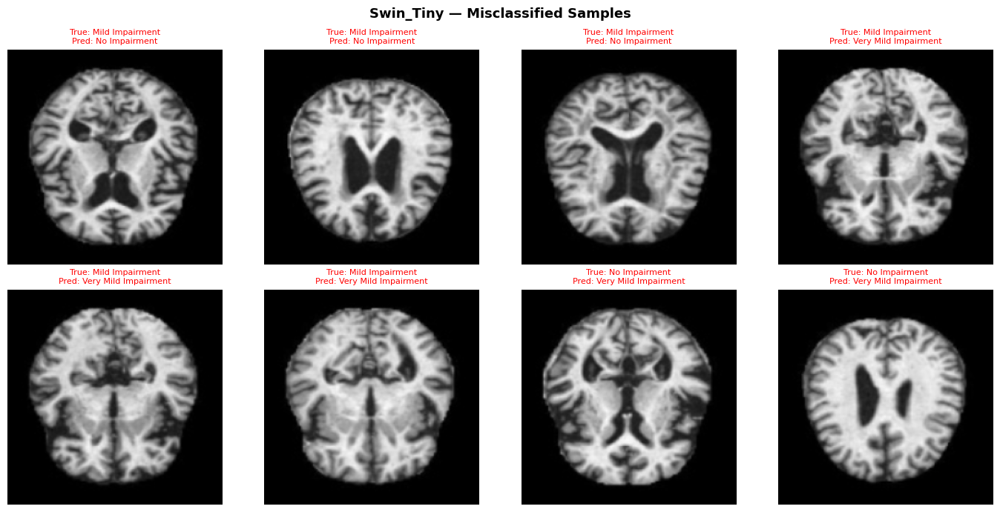

Total misclassified shown: 8


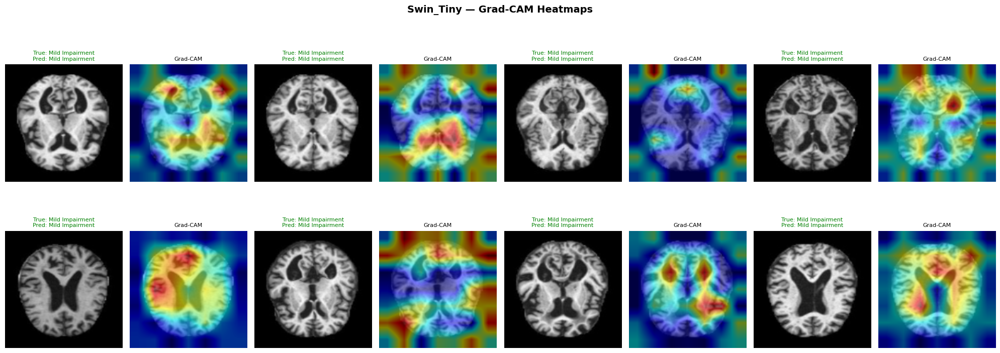

Grad-CAM complete for Swin_Tiny


In [67]:
# ============================================================
# Swin-Tiny — Evaluate + Grad-CAM
#
# Like ViT, Swin's final stage outputs (batch, tokens, channels) with
# no CLS token this time — at 224 input with window7/patch4, the last
# stage resolution is 7x7=49 tokens. reshape_transform folds these
# back into a (batch, channels, 7, 7) map.
# ============================================================
swin.load_state_dict(torch.load(history_swin["save_path"], map_location=device))

eval_swin = evaluate_model(swin, test_loader_224, CLASS_NAMES, MODEL_NAME)
plot_training_curves(history_swin, MODEL_NAME)
plot_confusion_matrix(eval_swin, CLASS_NAMES, MODEL_NAME)
mean_auc_swin, auc_scores_swin = plot_roc_curves(eval_swin, CLASS_NAMES, MODEL_NAME)
plot_confidence_distribution(eval_swin, CLASS_NAMES, MODEL_NAME)
plot_error_analysis(swin, test_loader_224, CLASS_NAMES, MODEL_NAME)

def reshape_transform_swin(tensor, height=7, width=7):
    result = tensor.reshape(tensor.size(0), height, width, tensor.size(2))
    result = result.transpose(2, 3).transpose(1, 2)  # -> (B, C, H, W)
    return result

run_gradcam(swin, MODEL_NAME, swin.layers[-1].blocks[-1].norm2, test_loader_224, CLASS_NAMES,
            reshape_transform=reshape_transform_swin)


In [63]:
save_model_result("Swin-Tiny", eval_swin, history_swin, mean_auc_swin)


Saved -> /content/drive/MyDrive/defence/project dataset/Alzheimer MRI/saved_models/results/Swin_Tiny_result.json


---
## PHASE 14 — Model Comparison Dashboard

In [64]:
# ============================================================
# PHASE 14 — Model Comparison Dashboard (Drive-backed)
# Rebuilds the comparison from saved JSON results on Google Drive.
# Works in a brand-new runtime -- you do NOT need to have trained
# or evaluated any model in this session. Just mount Drive (Phase 2)
# and run this cell once results exist for the models you care about.
# ============================================================
df_comparison = load_all_model_results()
df_comparison["Rank"] = df_comparison["Test Accuracy (%)"].rank(ascending=False).astype(int)
df_comparison = df_comparison.sort_values("Test Accuracy (%)", ascending=False).reset_index(drop=True)

print("\n" + "="*80)
print(" MODEL COMPARISON SUMMARY  (sorted by Test Accuracy)")
print(f" Models found: {len(df_comparison)} / 7")
if len(df_comparison) < 7:
    missing = {"VGG16","VGG19","DenseNet121","InceptionV3","ConvNeXt-Tiny","ViT-Small","Swin-Tiny"} - set(df_comparison["Model"])
    print(f" Still missing: {sorted(missing)}")
print("="*80)
print(df_comparison.to_string(index=False))
print("="*80)
print(f"\n  BEST MODEL   : {df_comparison.iloc[0]['Model']}")
print(f"  Test Accuracy: {df_comparison.iloc[0]['Test Accuracy (%)']:.2f}%")
print(f"  Mean AUC     : {df_comparison.iloc[0]['Mean AUC']:.4f}")
print(f"  Best Val Acc : {df_comparison.iloc[0]['Best Val Acc (%)']:.2f}%")
print("="*80)



 MODEL COMPARISON SUMMARY  (sorted by Test Accuracy)
 Models found: 7 / 7
        Model  Test Accuracy (%)  Mean AUC  Training Time (min)  Best Val Acc (%)  Rank
ConvNeXt-Tiny          97.989576  0.997196            16.178152         98.974609     1
    Swin-Tiny          96.947133  0.997619            27.718821         97.753906     2
  InceptionV3          95.234550  0.994817            21.179004         97.607422     3
    ViT-Small          89.203276  0.980611            17.471668         94.433594     4
  DenseNet121          88.905436  0.995207             7.219507         94.531250     5
        VGG16          88.309754  0.975720            33.765395         93.652344     6
        VGG19          86.448250  0.976344            39.209516         93.652344     7

  BEST MODEL   : ConvNeXt-Tiny
  Test Accuracy: 97.99%
  Mean AUC     : 0.9972
  Best Val Acc : 98.97%


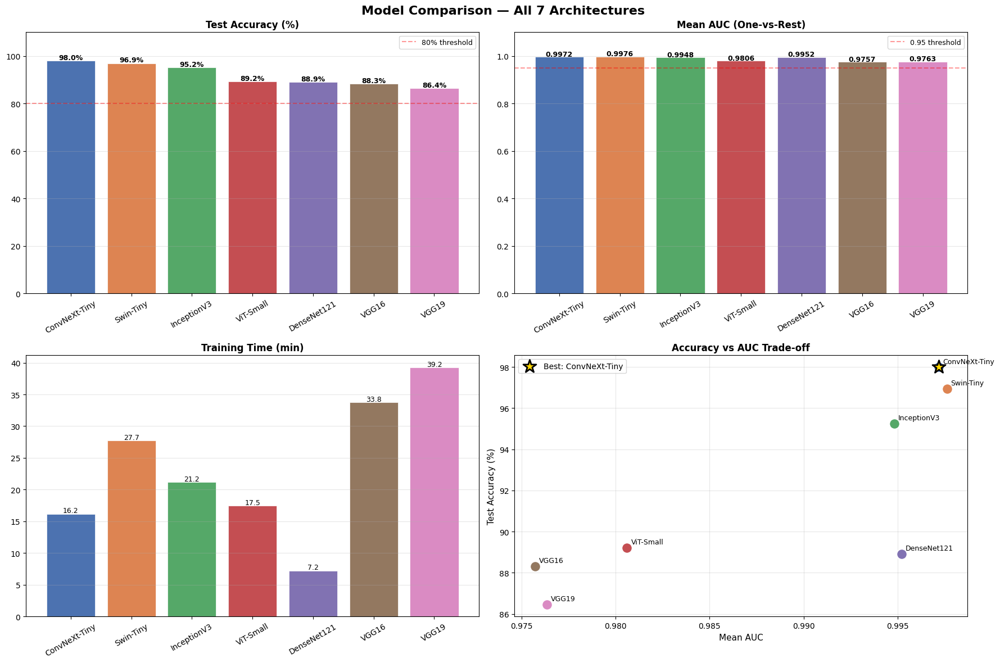


Comparison dashboard saved to /content/model_comparison_dashboard.png
Comparison dashboard + CSV saved to Google Drive.

BEST MODEL: ConvNeXt-Tiny
  Accuracy : 97.99%
  Mean AUC : 0.9972


In [65]:
# ============================================================
# Comparison Visualization — 4-panel dashboard
# ============================================================
fig, axes = plt.subplots(2, 2, figsize=(18, 12))
fig.suptitle("Model Comparison — All 7 Architectures", fontsize=16, fontweight='bold')

colors = ['#4C72B0','#DD8452','#55A868','#C44E52','#8172B2','#937860','#DA8BC3']
models_sorted = df_comparison["Model"].tolist()

# ── 1. Test Accuracy ──
ax = axes[0, 0]
bars = ax.bar(models_sorted, df_comparison["Test Accuracy (%)"], color=colors, edgecolor='white', linewidth=0.5)
ax.set_title("Test Accuracy (%)", fontweight='bold', fontsize=12)
ax.set_ylim(0, 110)
ax.axhline(y=80, color='red', linestyle='--', alpha=0.4, label='80% threshold')
ax.tick_params(axis='x', rotation=30)
ax.grid(axis='y', alpha=0.3)
ax.legend(fontsize=9)
for bar, val in zip(bars, df_comparison["Test Accuracy (%)"]):
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.5,
            f'{val:.1f}%', ha='center', fontsize=9, fontweight='bold')

# ── 2. Mean AUC ──
ax = axes[0, 1]
bars = ax.bar(models_sorted, df_comparison["Mean AUC"], color=colors, edgecolor='white', linewidth=0.5)
ax.set_title("Mean AUC (One-vs-Rest)", fontweight='bold', fontsize=12)
ax.set_ylim(0, 1.1)
ax.axhline(y=0.95, color='red', linestyle='--', alpha=0.4, label='0.95 threshold')
ax.tick_params(axis='x', rotation=30)
ax.grid(axis='y', alpha=0.3)
ax.legend(fontsize=9)
for bar, val in zip(bars, df_comparison["Mean AUC"]):
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.003,
            f'{val:.4f}', ha='center', fontsize=9, fontweight='bold')

# ── 3. Training Time ──
ax = axes[1, 0]
bars = ax.bar(models_sorted, df_comparison["Training Time (min)"], color=colors, edgecolor='white', linewidth=0.5)
ax.set_title("Training Time (min)", fontweight='bold', fontsize=12)
ax.tick_params(axis='x', rotation=30)
ax.grid(axis='y', alpha=0.3)
for bar, val in zip(bars, df_comparison["Training Time (min)"]):
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.2,
            f'{val:.1f}', ha='center', fontsize=9)

# ── 4. Accuracy vs AUC scatter ──
ax = axes[1, 1]
for i, row in df_comparison.iterrows():
    ax.scatter(row["Mean AUC"], row["Test Accuracy (%)"],
               color=colors[i], s=180, zorder=5, edgecolors='white', linewidth=1.5)
    ax.annotate(row["Model"], (row["Mean AUC"], row["Test Accuracy (%)"]),
                textcoords="offset points", xytext=(5, 5), fontsize=9)
ax.set_xlabel("Mean AUC", fontsize=11)
ax.set_ylabel("Test Accuracy (%)", fontsize=11)
ax.set_title("Accuracy vs AUC Trade-off", fontweight='bold', fontsize=12)
ax.grid(alpha=0.3)
# Highlight best model
best = df_comparison.iloc[0]
ax.scatter(best["Mean AUC"], best["Test Accuracy (%)"],
           s=300, color='gold', zorder=6, edgecolors='black', linewidth=2,
           marker='*', label=f'Best: {best["Model"]}')
ax.legend(fontsize=10)

plt.tight_layout()
plt.savefig("/content/model_comparison_dashboard.png", dpi=150, bbox_inches='tight')
plt.show()
print("\nComparison dashboard saved to /content/model_comparison_dashboard.png")

# Also save to Drive
import shutil, os
drive_dir = "/content/drive/MyDrive/defence/project dataset/Alzheimer MRI/saved_models"
os.makedirs(drive_dir, exist_ok=True)
try:
    shutil.copy2("/content/model_comparison_dashboard.png",
                 f"{drive_dir}/model_comparison_dashboard.png")
    df_comparison.to_csv(f"{drive_dir}/model_comparison_results.csv", index=False)
    print("Comparison dashboard + CSV saved to Google Drive.")
except Exception as e:
    print(f"Drive save skipped: {e}")

print(f"\nBEST MODEL: {df_comparison.iloc[0]['Model']}")
print(f"  Accuracy : {df_comparison.iloc[0]['Test Accuracy (%)']:.2f}%")
print(f"  Mean AUC : {df_comparison.iloc[0]['Mean AUC']:.4f}")


In [ ]:
# ============================================================
# PHASE 15 — Download All Best Model Weights
# ============================================================
from google.colab import files

model_files = [
    "/content/VGG16_best.pth",
    "/content/VGG19_best.pth",
    "/content/DenseNet121_best.pth",
    "/content/InceptionV3_best.pth",
    "/content/ConvNeXt_Tiny_best.pth",
    "/content/ViT_Small_best.pth",
    "/content/Swin_Tiny_best.pth",
]

for f in model_files:
    if os.path.exists(f):
        print(f"Downloading {f} ...")
        files.download(f)
    else:
        print(f"NOT FOUND (not yet trained): {f}")

print("\nAll available model weights downloaded.")


---
## ✅ Pipeline Complete

**Outputs produced per model:**
- Confusion Matrix
- Classification Report (Precision / Recall / F1)
- Training & Validation Loss Curve
- Training & Validation Accuracy Curve
- ROC Curves (per class) + Mean AUC
- Confidence Distribution Plot
- Error Analysis (Misclassified Samples)
- Grad-CAM Heatmaps

**Final Phase 14:** All 7 models compared on Accuracy, AUC, and Training Time.